## Set up notebook

In [1]:
# Import packages
import numpy as np
import os
import pandas as pd
import random as rm
from scipy.stats import pearsonr
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error, roc_curve, roc_auc_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from math import gamma, exp, log, log10, pi
import seaborn as sns
from astropy.io import fits
from astropy.table import Table, vstack
from astropy.coordinates import SkyCoord

In [2]:
# Set up matplotlib
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
from matplotlib.ticker import MultipleLocator
import mpl_scatter_density
%matplotlib inline
params = {'legend.fontsize': 22,
          'figure.figsize': (12, 8),
         'axes.labelsize': 22,
         'axes.titlesize': 24,
         'xtick.labelsize': 18,
         'ytick.labelsize': 18}
plt.rcParams.update(params)

In [3]:
# "Viridis-like" colormap with white background
white_viridis = mpl.colors.LinearSegmentedColormap.from_list('white_viridis', [
    (0, '#ffffff'),
    (1e-20, '#440053'),
    (0.2, '#404388'),
    (0.4, '#2a788e'),
    (0.6, '#21a784'),
    (0.8, '#78d151'),
    (1, '#fde624'), ], N=256)

## Import data

### Dual Sersic run

In [4]:
data = Table.read('../Data_tabs/CosmosDeep/dual_sersic/sepp_sersic_20240111T102212_out.fits')
data.columns

<TableColumns names=('fmf_reduced_chi_2','fmf_iterations','fmf_stop_reason','fmf_duration','fmf_flags','fmf_chi2_per_meta','fmf_iterations_per_meta','fmf_meta_iterations','cps_NIR_Y','cps_NIR_Y_err','mag_NIR_Y','mag_NIR_Y_err','flux_mujy_NIR_Y','flux_mujy_NIR_Y_err','cps_NIR_H','cps_NIR_H_err','mag_NIR_H','mag_NIR_H_err','flux_mujy_NIR_H','flux_mujy_NIR_H_err','cps_VIS','cps_VIS_err','mag_VIS','mag_VIS_err','flux_mujy_VIS','flux_mujy_VIS_err','cps_NIR_J','cps_NIR_J_err','mag_NIR_J','mag_NIR_J_err','flux_mujy_NIR_J','flux_mujy_NIR_J_err','x','x_err','y','y_err','ra','ra_err','dec','dec_err','sersic_radius_vis','sersic_radius_vis_err','sersic_radius_nir','sersic_radius_nir_err','sersic_ratio','sersic_ratio_err','sersic_vis','sersic_vis_err','sersic_nir','sersic_nir_err','angle_deg','angle_deg_err','assoc_match','assoc_values')>

In [5]:
d0 = Table.read('../Data_tabs/CosmosDeep/dual_sersic/EUC_MER_FINAL-CAT_TILE101545697-AE8A97_20240113T005844.888805Z_00.00.fits', format='fits')
morph0 = Table.read('../Data_tabs/CosmosDeep/dual_sersic/EUC_MER_FINAL-MORPH-CAT_TILE101545697-2A43F8_20240113T005843.666295Z_00.00.fits', format='fits')
df_0 = d0.to_pandas()
dfm = morph0.to_pandas()
df_0.shape, dfm.shape

((59545, 337), (59545, 94))

In [6]:
df = df_0.merge(dfm, how='inner', on=['OBJECT_ID'])
df.shape

(59545, 430)

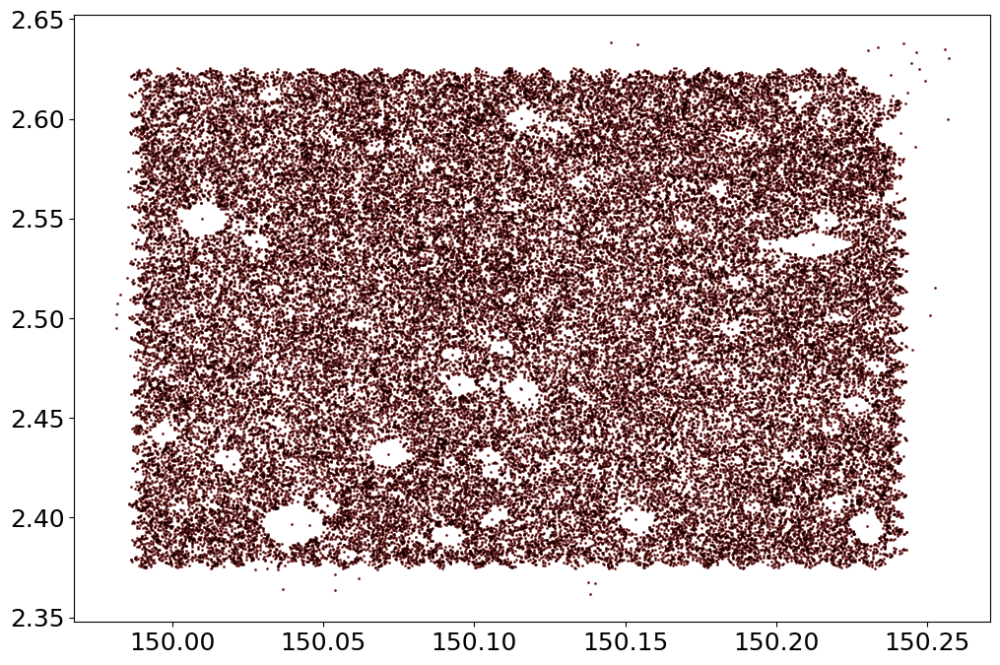

In [7]:
plt.figure()
plt.scatter(df['RIGHT_ASCENSION'].values, df['DECLINATION'].values, c='r', s=1, alpha=0.5)
plt.scatter(data['ra'], data['dec'], c='k', s=1, alpha=0.5)
plt.show()

In [8]:
df_coords = SkyCoord(df['RIGHT_ASCENSION'].values, df['DECLINATION'].values, unit="deg")
dt_coords = SkyCoord(data['ra'], data['dec'], unit="deg")
idx, sep2d, _ = df_coords.match_to_catalog_sky(dt_coords)
print(len(idx), max(sep2d))
dt = data[idx]
(dt['assoc_values'][:,4]).astype(int)

59545 0d00m00s


0
1
2
3
4
5
6
7
8
9
10


In [9]:
for band in ['VIS', 'Y', 'J', 'H']:
    df['MAG_'+band+'_APER'] = -2.5*np.log10(df['FLUX_'+band+'_APER']/3631) + 30.0 - 15.0
    df['MAGERR_'+band+'_APER'] = 2.5*df['FLUXERR_'+band+'_APER']/(np.log(10)*df['FLUX_'+band+'_APER'])
    df['MAG_'+band+'_SERSIC'] = -2.5*np.log10(df['FLUX_'+band+'_SERSIC']/3631) + 30.0 - 15.0
    df['MAGERR_'+band+'_SERSIC'] = 2.5*df['FLUXERR_'+band+'_SERSIC']/(np.log(10)*df['FLUX_'+band+'_SERSIC'])
    df['MAG_'+band+'_DISK_SERSIC'] = -2.5*np.log10(df['FLUX_'+band+'_DISK_SERSIC']/3631) + 30.0 - 15.0
    df['MAGERR_'+band+'_DISK_SERSIC'] = 2.5*df['FLUXERR_'+band+'_DISK_SERSIC']/(np.log(10)*df['FLUX_'+band+'_DISK_SERSIC'])
    df['FLUX_'+band+'_B'] = df['FLUX_'+band+'_SERSIC']*df['SERSIC_FRACT_'+band+'_DISK_SERSIC']
    df['FLUX_'+band+'_D'] = df['FLUX_'+band+'_SERSIC']*(1 - df['SERSIC_FRACT_'+band+'_DISK_SERSIC'])
    df['FLUXERR_'+band+'_B'] = df['FLUX_'+band+'_B']*np.sqrt(
                                (df['FLUXERR_'+band+'_SERSIC']/df['FLUX_'+band+'_SERSIC'])**2 +
                            (df['SERSIC_FRACT_'+band+'_DISK_SERSIC_ERR']/df['SERSIC_FRACT_'+band+'_DISK_SERSIC'])**2 )
    df['FLUXERR_'+band+'_D'] = df['FLUX_'+band+'_D']*np.sqrt(
                                (df['FLUXERR_'+band+'_SERSIC']/df['FLUX_'+band+'_SERSIC'])**2 +
                            (df['SERSIC_FRACT_'+band+'_DISK_SERSIC_ERR']/(1-df['SERSIC_FRACT_'+band+'_DISK_SERSIC']))**2 )
    df['MAG_'+band+'_B'] = -2.5*np.log10(df['FLUX_'+band+'_B']/3631) + 30.0 - 15.0
    df['MAGERR_'+band+'_B'] = 2.5*df['FLUXERR_'+band+'_B']/(np.log(10)*df['FLUX_'+band+'_B'])
    df['MAG_'+band+'_D'] = -2.5*np.log10(df['FLUX_'+band+'_D']/3631) + 30.0 - 5.0
    df['MAGERR_'+band+'_D'] = 2.5*df['FLUXERR_'+band+'_D']/(np.log(10)*df['FLUX_'+band+'_D'])

C:\Users\quilley\AppData\Local\anaconda3\lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\quilley\AppData\Local\anaconda3\lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\quilley\AppData\Local\anaconda3\lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\quilley\AppData\Local\anaconda3\lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


### Single sersic run

In [10]:
data_single = Table.read('../Data_tabs/CosmosDeep/single_sersic/sepp_sersic_20231220T101523_out.fits', format='fits')

In [11]:
data_single.columns

<TableColumns names=('fmf_reduced_chi_2','fmf_iterations','fmf_stop_reason','fmf_duration','fmf_flags','fmf_chi2_per_meta','fmf_iterations_per_meta','fmf_meta_iterations','cps_NIR_Y','cps_NIR_Y_err','mag_NIR_Y','mag_NIR_Y_err','flux_mujy_NIR_Y','flux_mujy_NIR_Y_err','cps_NIR_H','cps_NIR_H_err','mag_NIR_H','mag_NIR_H_err','flux_mujy_NIR_H','flux_mujy_NIR_H_err','cps_VIS','cps_VIS_err','mag_VIS','mag_VIS_err','flux_mujy_VIS','flux_mujy_VIS_err','cps_NIR_J','cps_NIR_J_err','mag_NIR_J','mag_NIR_J_err','flux_mujy_NIR_J','flux_mujy_NIR_J_err','x','x_err','y','y_err','ra','ra_err','dec','dec_err','sersic_radius','sersic_radius_err','sersic_ratio','sersic_ratio_err','sersic','sersic_err','angle_deg','angle_deg_err','assoc_match','assoc_values')>

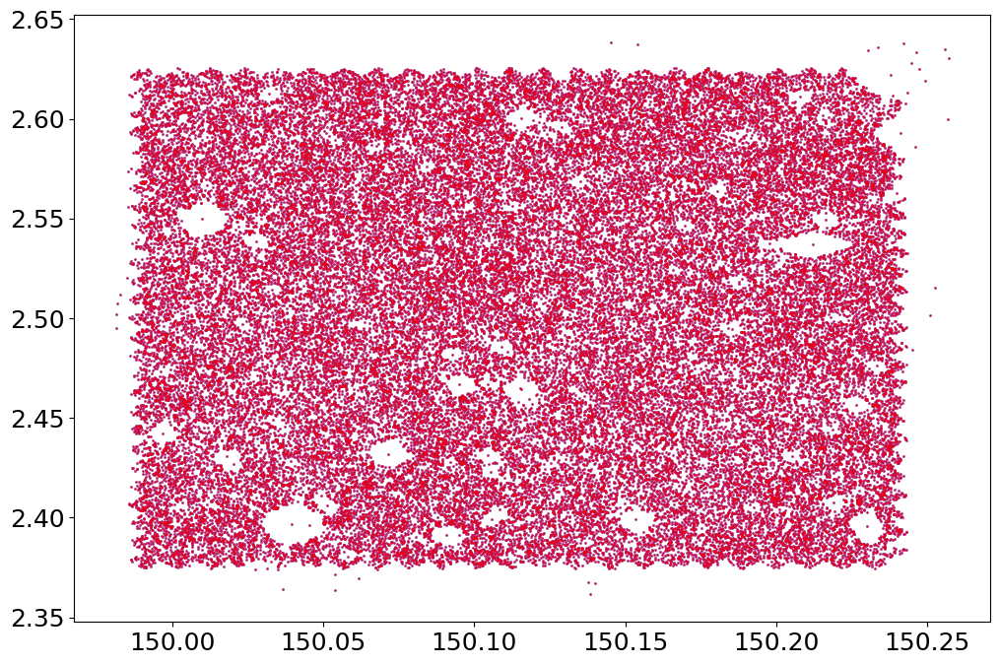

In [12]:
plt.figure()
plt.scatter(data['ra'], data['dec'], c='b', s=1, alpha=0.5)
plt.scatter(data_single['ra'], data_single['dec'], c='r', s=1, alpha=0.5)
plt.show()

In [13]:
df_coords = SkyCoord(df['RIGHT_ASCENSION'].values, df['DECLINATION'].values, unit="deg")
dts_coords = SkyCoord(data_single['ra'], data_single['dec'], unit="deg")
idx_2, sep2d_2, _ = df_coords.match_to_catalog_sky(dts_coords)
print(len(idx_2), max(sep2d_2))
ds = data_single[idx_2]
(ds['assoc_values'][:,4]).astype(int)

59545 0d00m00s


0
1
2
3
4
5
6
7
8
9
10


## Single sersic vs dual sersic

### Magnitudes and colors

C:\Users\quilley\AppData\Local\anaconda3\lib\site-packages\mpl_scatter_density\generic_density_artist.py:77: RuntimeWarning: All-NaN slice encountered
  vmin = self._density_vmin(array)
C:\Users\quilley\AppData\Local\anaconda3\lib\site-packages\mpl_scatter_density\generic_density_artist.py:82: RuntimeWarning: All-NaN slice encountered
  vmax = self._density_vmax(array)


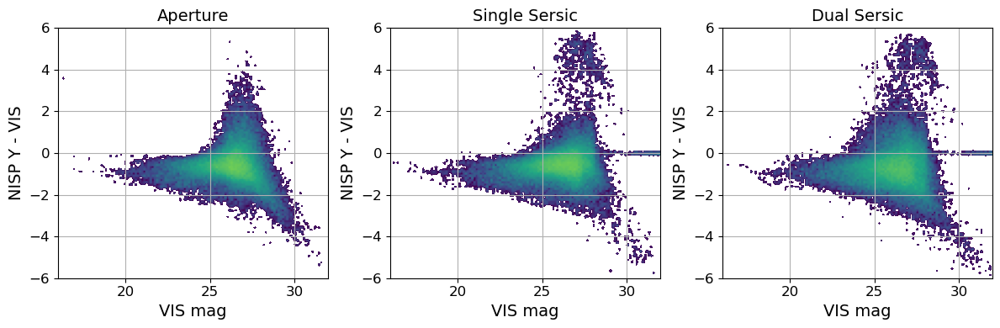

In [14]:
fig, axs = plt.subplots(1, 3, sharey=True, sharex=True, figsize=(12,4))

axs[0].remove()
ax1= fig.add_subplot(1, 3, 1, projection='scatter_density')
ax1.set_title('Aperture', fontsize = 14)
V, Y, J, H = df['MAG_VIS_APER'], df['MAG_Y_APER'], df['MAG_J_APER'], df['MAG_H_APER']
density1 = ax1.scatter_density(V, Y-V, norm=mpl.colors.LogNorm(vmin=1, vmax=1000), cmap=white_viridis, dpi = 40)

axs[1].remove()
ax2= fig.add_subplot(1, 3, 2, projection='scatter_density')
ax2.set_title('Single Sersic', fontsize = 14)
V, Y, J, H = ds['mag_VIS'], ds['mag_NIR_Y'], ds['mag_NIR_J'], ds['mag_NIR_H']
density2 = ax2.scatter_density(V, Y-V, norm=mpl.colors.LogNorm(vmin=1, vmax=1000), cmap=white_viridis, dpi = 40)

axs[2].remove()
ax3= fig.add_subplot(1, 3, 3, projection='scatter_density')
ax3.set_title('Dual Sersic', fontsize = 14)
V, Y, J, H = dt['mag_VIS'], dt['mag_NIR_Y'], dt['mag_NIR_J'], dt['mag_NIR_H']
density3 = ax3.scatter_density(V, Y-V, norm=mpl.colors.LogNorm(vmin=1, vmax=1000), cmap=white_viridis, dpi = 40)

for ax in [ax1, ax2, ax3]:
    ax.set_xlabel(r'VIS mag', fontsize = 14)
    ax.set_ylabel(r'NISP Y - VIS', fontsize = 14)
    ax.grid()
    ax.set(xlim = (16,32), ylim = (-6,6))
    ax.tick_params(labelsize = 12)

plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/Y-VIS_color_vs_VIS_mag_all_density_plot.png', format='png')
plt.show()

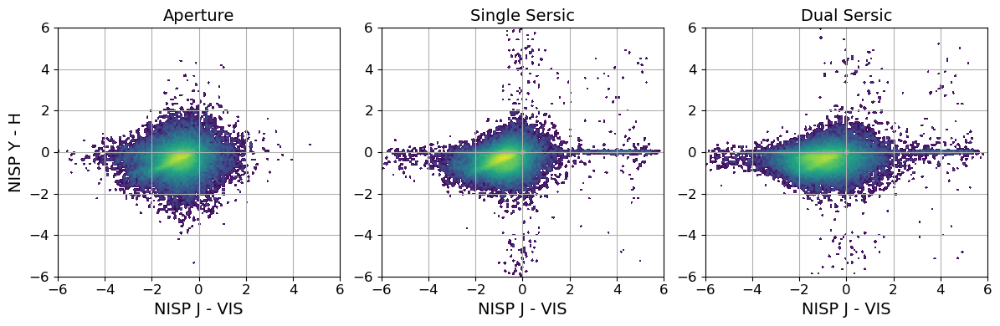

In [15]:
fig, axs = plt.subplots(1, 3, sharey=True, sharex=True, figsize=(12,4))

axs[0].remove()
ax1= fig.add_subplot(1, 3, 1, projection='scatter_density')
ax1.set_title('Aperture', fontsize = 14)
V, Y, J, H = df['MAG_VIS_APER'], df['MAG_Y_APER'], df['MAG_J_APER'], df['MAG_H_APER']
density1 = ax1.scatter_density(J-V, H-Y, norm=mpl.colors.LogNorm(vmin=1, vmax=1000), cmap=white_viridis, dpi = 40)

axs[1].remove()
ax2= fig.add_subplot(1, 3, 2, projection='scatter_density')
ax2.set_title('Single Sersic', fontsize = 14)
V, Y, J, H = ds['mag_VIS'], ds['mag_NIR_Y'], ds['mag_NIR_J'], ds['mag_NIR_H']
density2 = ax2.scatter_density(J-V, H-Y, norm=mpl.colors.LogNorm(vmin=1, vmax=1000), cmap=white_viridis, dpi = 40)

axs[2].remove()
ax3= fig.add_subplot(1, 3, 3, projection='scatter_density')
ax3.set_title('Dual Sersic', fontsize = 14)
V, Y, J, H = dt['mag_VIS'], dt['mag_NIR_Y'], dt['mag_NIR_J'], dt['mag_NIR_H']
density3 = ax3.scatter_density(J-V, H-Y, norm=mpl.colors.LogNorm(vmin=1, vmax=1000), cmap=white_viridis, dpi = 40)

#fig.colorbar(density, label='Number of points per pixel')

for ax in [ax1, ax2, ax3]:
    ax.set_xlabel(r'NISP J - VIS', fontsize = 14)
    ax.grid()
    ax.set(xlim = (-6,6), ylim = (-6,6))
    ax.tick_params(labelsize = 12)
    
ax1.set_ylabel(r'NISP Y - H', fontsize = 14)

plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/H-Y_vs_J-VIS_all_density_plot.png', format='png')
plt.show()

### Stability of photometry

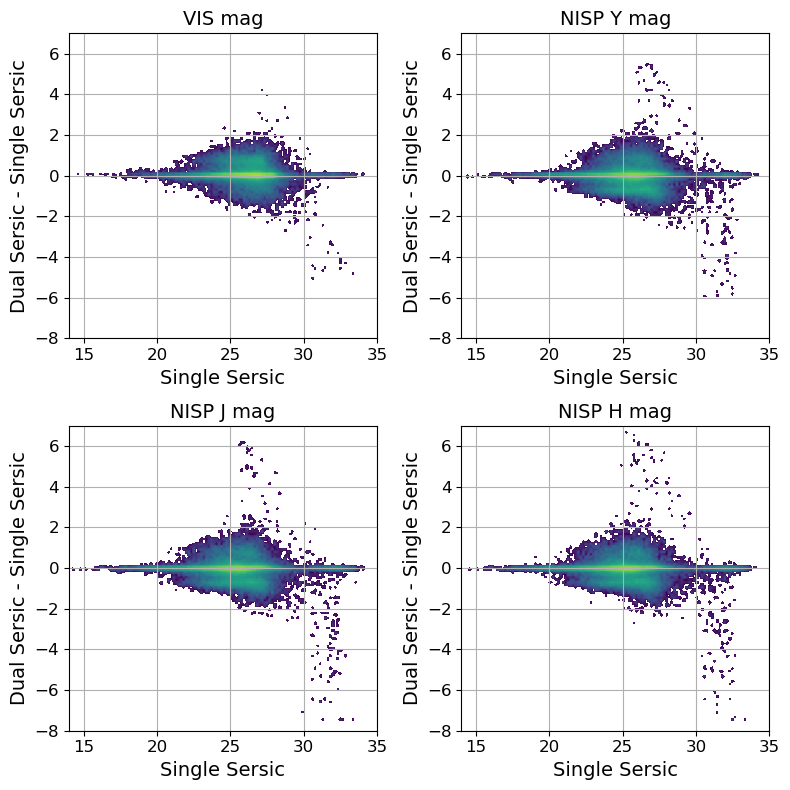

In [16]:
fig, axs = plt.subplots(2, 2, figsize=(8,8))

axs[0,0].remove()
ax1= fig.add_subplot(2, 2, 1, projection='scatter_density')
ax1.set_title('VIS mag', fontsize = 14)
x, y = ds['mag_VIS'], dt['mag_VIS']
density = ax1.scatter_density(x, y-x, norm=mpl.colors.LogNorm(vmin=1, vmax=3000), cmap=white_viridis, dpi = 40)

axs[0,1].remove()
ax2= fig.add_subplot(2, 2, 2, projection='scatter_density')
ax2.set_title('NISP Y mag', fontsize = 14)
x, y = ds['mag_NIR_Y'], dt['mag_NIR_Y']
density = ax2.scatter_density(x, y-x, norm=mpl.colors.LogNorm(vmin=1, vmax=3000), cmap=white_viridis, dpi = 40)

axs[1,0].remove()
ax3= fig.add_subplot(2, 2, 3, projection='scatter_density')
ax3.set_title('NISP J mag', fontsize = 14)
x, y = ds['mag_NIR_J'], dt['mag_NIR_J']
density = ax3.scatter_density(x, y-x, norm=mpl.colors.LogNorm(vmin=1, vmax=3000), cmap=white_viridis, dpi = 40)

axs[1,1].remove()
ax4= fig.add_subplot(2, 2, 4, projection='scatter_density')
ax4.set_title('NISP H mag', fontsize = 14)
x, y = ds['mag_NIR_H'], dt['mag_NIR_H']
density = ax4.scatter_density(x, y-x, norm=mpl.colors.LogNorm(vmin=1, vmax=3000), cmap=white_viridis, dpi = 40)


for ax in [ax1, ax2, ax3, ax4]:
    ax.set_xlabel(r'Single Sersic', fontsize = 14)
    ax.set_ylabel(r'Dual Sersic - Single Sersic', fontsize = 14)
    ax.grid()
    ax.set(xlim = (14,35), ylim = (-8,7))
    ax.tick_params(labelsize = 12)
    

plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/mag_dual_vs_single_sersic.png', format='png')
plt.show()

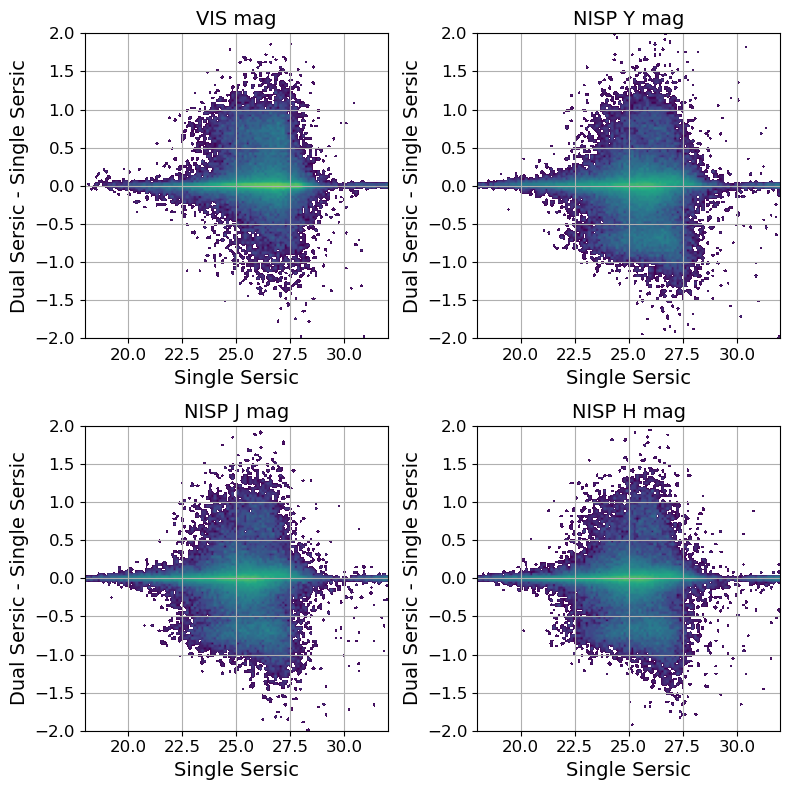

In [17]:
fig, axs = plt.subplots(2, 2, figsize=(8,8))

axs[0,0].remove()
ax1= fig.add_subplot(2, 2, 1, projection='scatter_density')
ax1.set_title('VIS mag', fontsize = 14)
x, y = ds['mag_VIS'], dt['mag_VIS']
density = ax1.scatter_density(x, y-x, norm=mpl.colors.LogNorm(vmin=1, vmax=3000), cmap=white_viridis, dpi = 40)

axs[0,1].remove()
ax2= fig.add_subplot(2, 2, 2, projection='scatter_density')
ax2.set_title('NISP Y mag', fontsize = 14)
x, y = ds['mag_NIR_Y'], dt['mag_NIR_Y']
density = ax2.scatter_density(x, y-x, norm=mpl.colors.LogNorm(vmin=1, vmax=3000), cmap=white_viridis, dpi = 40)

axs[1,0].remove()
ax3= fig.add_subplot(2, 2, 3, projection='scatter_density')
ax3.set_title('NISP J mag', fontsize = 14)
x, y = ds['mag_NIR_J'], dt['mag_NIR_J']
density = ax3.scatter_density(x, y-x, norm=mpl.colors.LogNorm(vmin=1, vmax=3000), cmap=white_viridis, dpi = 40)

axs[1,1].remove()
ax4= fig.add_subplot(2, 2, 4, projection='scatter_density')
ax4.set_title('NISP H mag', fontsize = 14)
x, y = ds['mag_NIR_H'], dt['mag_NIR_H']
density = ax4.scatter_density(x, y-x, norm=mpl.colors.LogNorm(vmin=1, vmax=3000), cmap=white_viridis, dpi = 40)


for ax in [ax1, ax2, ax3, ax4]:
    ax.set_xlabel(r'Single Sersic', fontsize = 14)
    ax.set_ylabel(r'Dual Sersic - Single Sersic', fontsize = 14)
    ax.grid()
    ax.set(xlim = (18,32), ylim = (-2,2))
    ax.tick_params(labelsize = 12)
    

plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/mag_dual_vs_single_sersic_zoom.png', format='png')
plt.show()

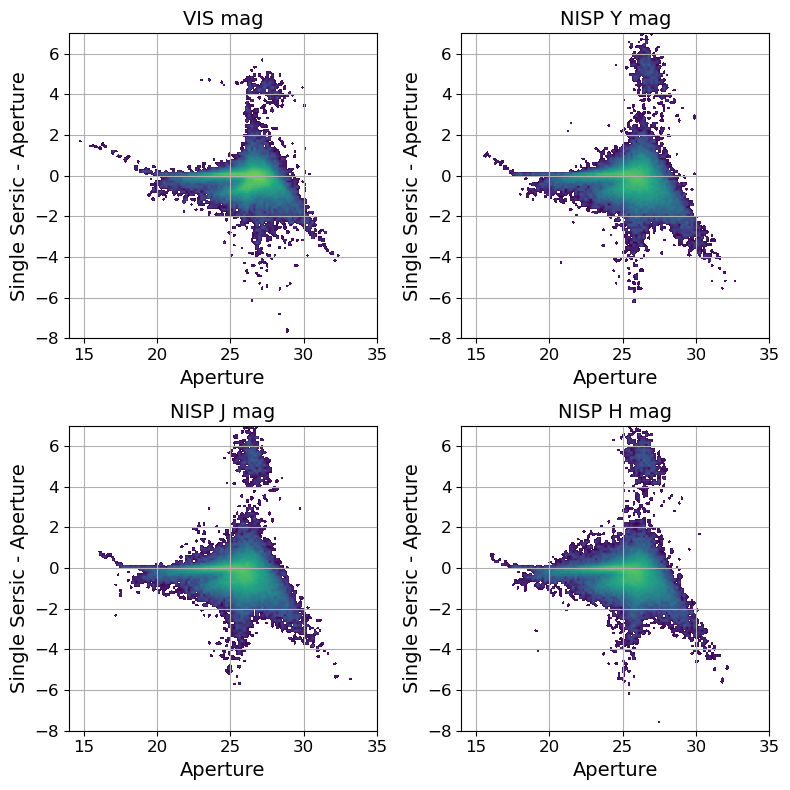

In [18]:
fig, axs = plt.subplots(2, 2, figsize=(8,8))

axs[0,0].remove()
ax1= fig.add_subplot(2, 2, 1, projection='scatter_density')
ax1.set_title('VIS mag', fontsize = 14)
x, y = ds['mag_VIS'], df['MAG_VIS_APER']
density = ax1.scatter_density(y, x-y, norm=mpl.colors.LogNorm(vmin=1, vmax=3000), cmap=white_viridis, dpi = 40)

axs[0,1].remove()
ax2= fig.add_subplot(2, 2, 2, projection='scatter_density')
ax2.set_title('NISP Y mag', fontsize = 14)
x, y = ds['mag_NIR_Y'], df['MAG_Y_APER']
density = ax2.scatter_density(y, x-y, norm=mpl.colors.LogNorm(vmin=1, vmax=3000), cmap=white_viridis, dpi = 40)

axs[1,0].remove()
ax3= fig.add_subplot(2, 2, 3, projection='scatter_density')
ax3.set_title('NISP J mag', fontsize = 14)
x, y = ds['mag_NIR_J'], df['MAG_J_APER']
density = ax3.scatter_density(y, x-y, norm=mpl.colors.LogNorm(vmin=1, vmax=3000), cmap=white_viridis, dpi = 40)

axs[1,1].remove()
ax4= fig.add_subplot(2, 2, 4, projection='scatter_density')
ax4.set_title('NISP H mag', fontsize = 14)
x, y = ds['mag_NIR_H'], df['MAG_H_APER']
density = ax4.scatter_density(y, x-y, norm=mpl.colors.LogNorm(vmin=1, vmax=3000), cmap=white_viridis, dpi = 40)


for ax in [ax1, ax2, ax3, ax4]:
    ax.set_xlabel(r'Aperture', fontsize = 14)
    ax.set_ylabel(r'Single Sersic - Aperture', fontsize = 14)
    ax.grid()
    ax.set(xlim = (14,35), ylim = (-8,7))
    ax.tick_params(labelsize = 12)
    

plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/mag_single_sersic_vs_aper.png', format='png')
plt.show()

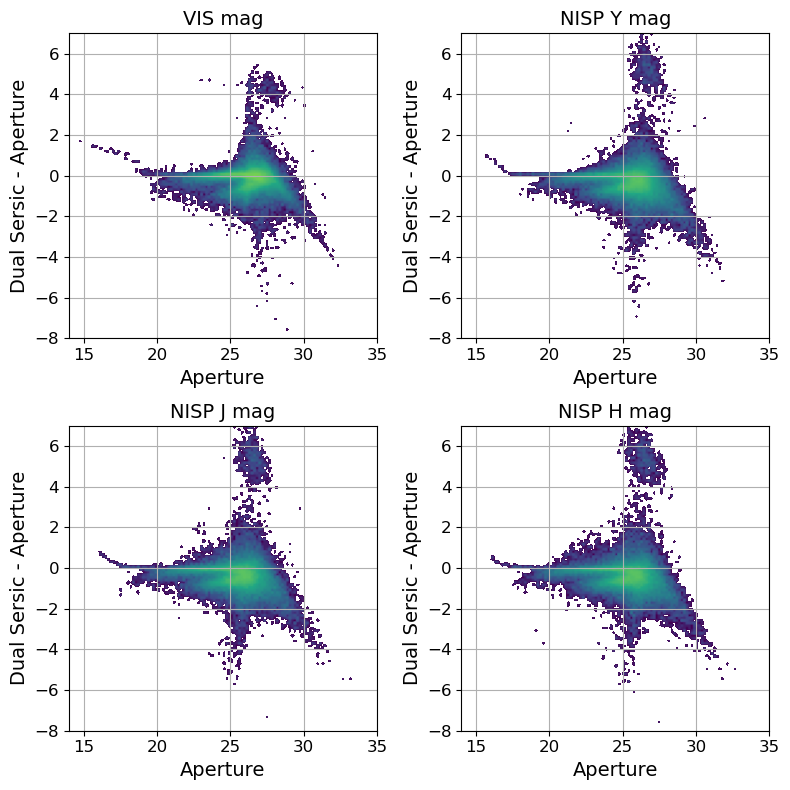

In [19]:
fig, axs = plt.subplots(2, 2, figsize=(8,8))

axs[0,0].remove()
ax1= fig.add_subplot(2, 2, 1, projection='scatter_density')
ax1.set_title('VIS mag', fontsize = 14)
x, y = dt['mag_VIS'], df['MAG_VIS_APER']
density = ax1.scatter_density(y, x-y, norm=mpl.colors.LogNorm(vmin=1, vmax=3000), cmap=white_viridis, dpi = 40)

axs[0,1].remove()
ax2= fig.add_subplot(2, 2, 2, projection='scatter_density')
ax2.set_title('NISP Y mag', fontsize = 14)
x, y = dt['mag_NIR_Y'], df['MAG_Y_APER']
density = ax2.scatter_density(y, x-y, norm=mpl.colors.LogNorm(vmin=1, vmax=3000), cmap=white_viridis, dpi = 40)

axs[1,0].remove()
ax3= fig.add_subplot(2, 2, 3, projection='scatter_density')
ax3.set_title('NISP J mag', fontsize = 14)
x, y = dt['mag_NIR_J'], df['MAG_J_APER']
density = ax3.scatter_density(y, x-y, norm=mpl.colors.LogNorm(vmin=1, vmax=3000), cmap=white_viridis, dpi = 40)

axs[1,1].remove()
ax4= fig.add_subplot(2, 2, 4, projection='scatter_density')
ax4.set_title('NISP H mag', fontsize = 14)
x, y = dt['mag_NIR_H'], df['MAG_H_APER']
density = ax4.scatter_density(y, x-y, norm=mpl.colors.LogNorm(vmin=1, vmax=3000), cmap=white_viridis, dpi = 40)


for ax in [ax1, ax2, ax3, ax4]:
    ax.set_xlabel(r'Aperture', fontsize = 14)
    ax.set_ylabel(r'Dual Sersic - Aperture', fontsize = 14)
    ax.grid()
    ax.set(xlim = (14,35), ylim = (-8,7))
    ax.tick_params(labelsize = 12)
    

plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/mag_dual_sersic_vs_aper.png', format='png')
plt.show()

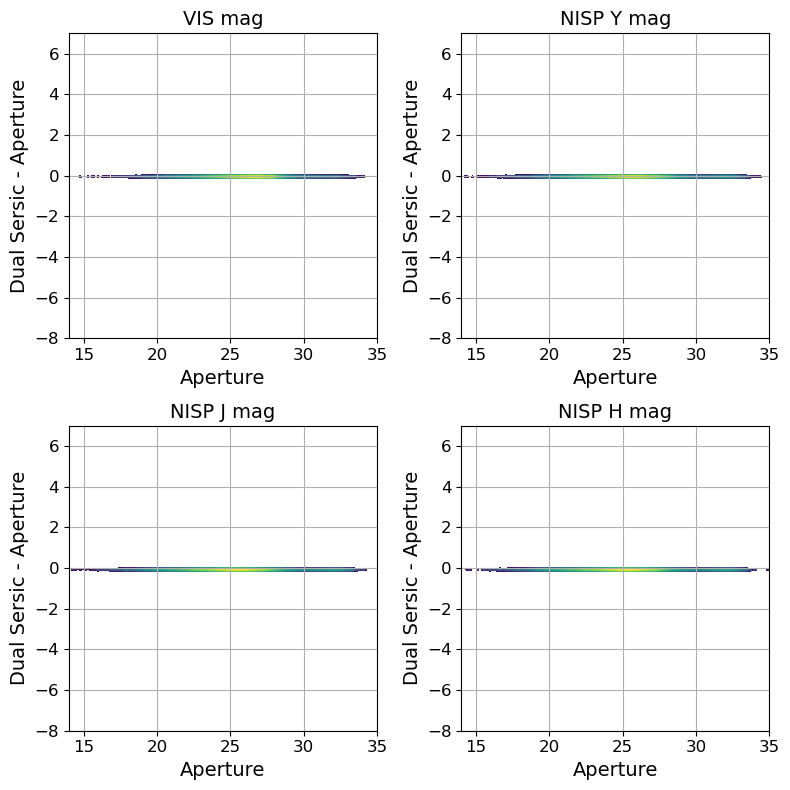

In [20]:
fig, axs = plt.subplots(2, 2, figsize=(8,8))

axs[0,0].remove()
ax1= fig.add_subplot(2, 2, 1, projection='scatter_density')
ax1.set_title('VIS mag', fontsize = 14)
x, y = dt['mag_VIS'], df['MAG_VIS_SERSIC']
density = ax1.scatter_density(y, x-y, norm=mpl.colors.LogNorm(vmin=1, vmax=3000), cmap=white_viridis, dpi = 40)

axs[0,1].remove()
ax2= fig.add_subplot(2, 2, 2, projection='scatter_density')
ax2.set_title('NISP Y mag', fontsize = 14)
x, y = dt['mag_NIR_Y'], df['MAG_Y_SERSIC']
density = ax2.scatter_density(y, x-y, norm=mpl.colors.LogNorm(vmin=1, vmax=3000), cmap=white_viridis, dpi = 40)

axs[1,0].remove()
ax3= fig.add_subplot(2, 2, 3, projection='scatter_density')
ax3.set_title('NISP J mag', fontsize = 14)
x, y = dt['mag_NIR_J'], df['MAG_J_SERSIC']
density = ax3.scatter_density(y, x-y, norm=mpl.colors.LogNorm(vmin=1, vmax=3000), cmap=white_viridis, dpi = 40)

axs[1,1].remove()
ax4= fig.add_subplot(2, 2, 4, projection='scatter_density')
ax4.set_title('NISP H mag', fontsize = 14)
x, y = dt['mag_NIR_H'], df['MAG_H_SERSIC']
density = ax4.scatter_density(y, x-y, norm=mpl.colors.LogNorm(vmin=1, vmax=3000), cmap=white_viridis, dpi = 40)


for ax in [ax1, ax2, ax3, ax4]:
    ax.set_xlabel(r'Aperture', fontsize = 14)
    ax.set_ylabel(r'Dual Sersic - Aperture', fontsize = 14)
    ax.grid()
    ax.set(xlim = (14,35), ylim = (-8,7))
    ax.tick_params(labelsize = 12)
    

plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/mag_dual_sersic_vs_itself_check.png', format='png')
plt.show()

### Stability of Sersic parameters

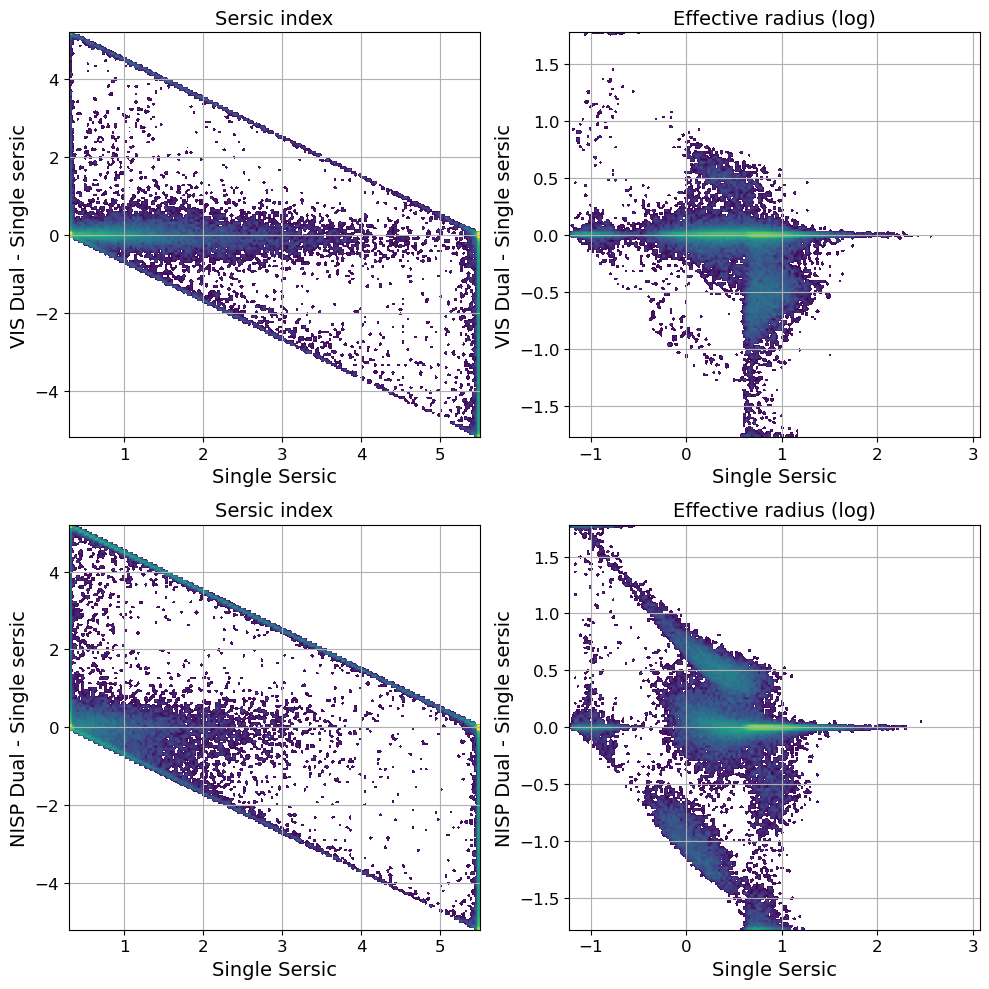

In [21]:
fig, axs = plt.subplots(2, 2, figsize=(10,10))

axs[0,0].remove()
ax1= fig.add_subplot(2, 2, 1, projection='scatter_density')
ax1.set_title('Sersic index', fontsize = 14)
x, y = ds['sersic'], dt['sersic_vis']
density = ax1.scatter_density(x, y-x, norm=mpl.colors.LogNorm(vmin=1, vmax=3000), cmap=white_viridis, dpi = 40)

axs[0,1].remove()
ax2= fig.add_subplot(2, 2, 2, projection='scatter_density')
ax2.set_title('Effective radius (log)', fontsize = 14)
x, y = np.log10(ds['sersic_radius']), np.log10(dt['sersic_radius_vis'])
density = ax2.scatter_density(x, y-x, norm=mpl.colors.LogNorm(vmin=1, vmax=3000), cmap=white_viridis, dpi = 40)

axs[1,0].remove()
ax3= fig.add_subplot(2, 2, 3, projection='scatter_density')
ax3.set_title('Sersic index', fontsize = 14)
x, y = ds['sersic'], dt['sersic_nir']
density = ax3.scatter_density(x, y-x, norm=mpl.colors.LogNorm(vmin=1, vmax=3000), cmap=white_viridis, dpi = 40)

axs[1,1].remove()
ax4= fig.add_subplot(2, 2, 4, projection='scatter_density')
ax4.set_title('Effective radius (log)', fontsize = 14)
x, y = np.log10(ds['sersic_radius']), np.log10(dt['sersic_radius_nir'])
density = ax4.scatter_density(x, y-x, norm=mpl.colors.LogNorm(vmin=1, vmax=3000), cmap=white_viridis, dpi = 40)


for ax in [ax1, ax2, ax3, ax4]:
    ax.set_xlabel(r'Single Sersic', fontsize = 14)
    ax.grid()
    #ax.set(xlim = (14,35), ylim = (-8,7))
    ax.tick_params(labelsize = 12)
for ax in [ax1, ax2]:
    ax.set_ylabel(r'VIS Dual - Single sersic', fontsize = 14)
for ax in [ax3, ax4]:
    ax.set_ylabel(r'NISP Dual - Single sersic', fontsize = 14)

plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/morph_param_dual_vs_single_sersic.png', format='png')
plt.show()

### Effective radius

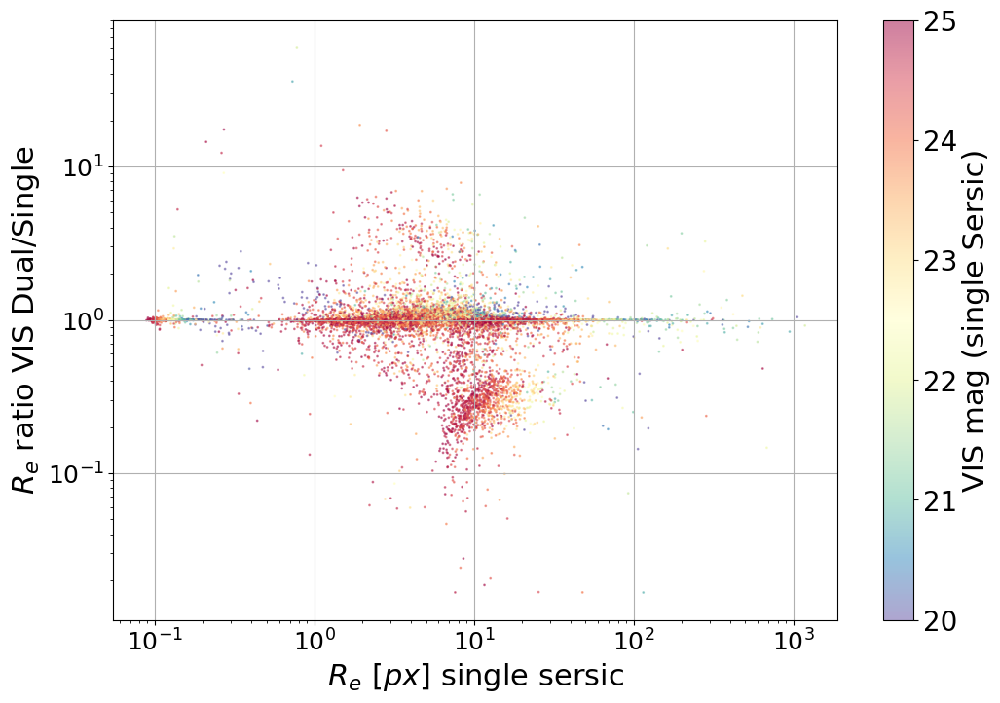

In [22]:
x, y = ds['sersic_radius'], dt['sersic_radius_vis']
z = ds['mag_VIS']

mag_lim = z < 25
x, y, z = x[mag_lim], y[mag_lim], z[mag_lim]

im = plt.scatter(x, y/x, s=1, c=z, cmap='Spectral_r', alpha=0.5, norm=mpl.colors.Normalize(vmin=20, vmax=25))

cbar = plt.colorbar(im)
cbar.set_label(r'VIS mag (single Sersic)', fontsize = 22) 
cbar.ax.tick_params(labelsize = 20)   

plt.xlabel(r'$R_e \ [px]$ single sersic')
plt.ylabel(r'$R_e$ ratio VIS Dual/Single')
plt.xscale('log')
plt.yscale('log')
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/Re_VIS_dual_vs_single_cmap_mag.png', format='png')
plt.show()

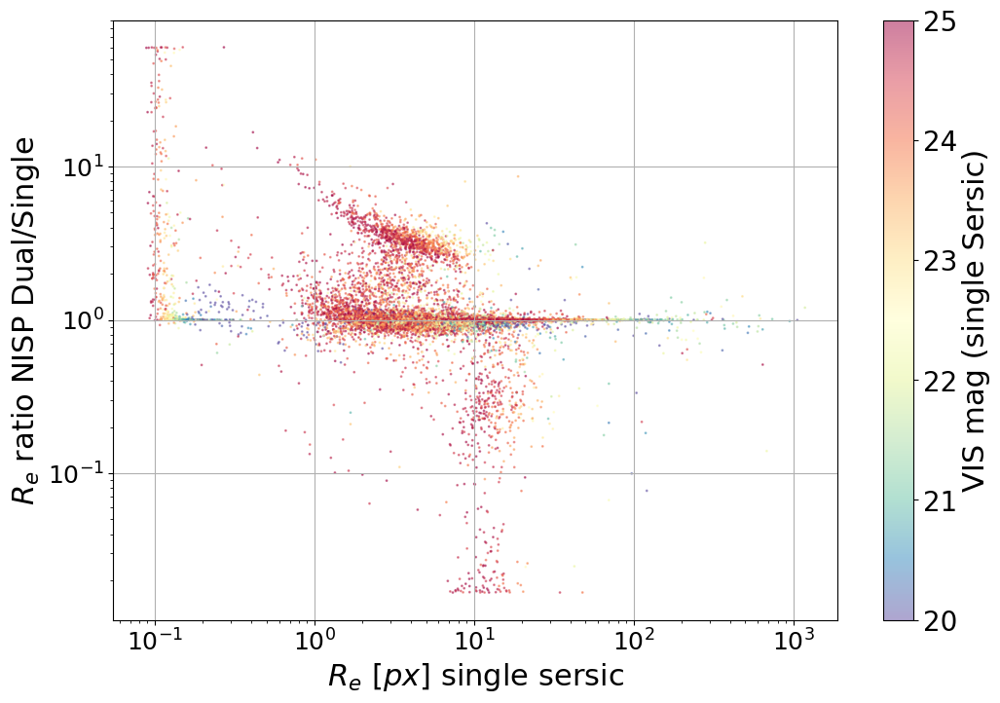

In [23]:
x, y = ds['sersic_radius'], dt['sersic_radius_nir']
z = ds['mag_VIS']

mag_lim = z < 25
x, y, z = x[mag_lim], y[mag_lim], z[mag_lim]

im = plt.scatter(x, y/x, s=1, c=z, cmap='Spectral_r', alpha=0.5, norm=mpl.colors.Normalize(vmin=20, vmax=25))

cbar = plt.colorbar(im)
cbar.set_label(r'VIS mag (single Sersic)', fontsize = 22) 
cbar.ax.tick_params(labelsize = 20)   

plt.xlabel(r'$R_e \ [px]$ single sersic')
plt.ylabel(r'$R_e$ ratio NISP Dual/Single')
plt.xscale('log')
plt.yscale('log')
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/Re_NISP_dual_vs_single_cmap_mag.png', format='png')
plt.show()

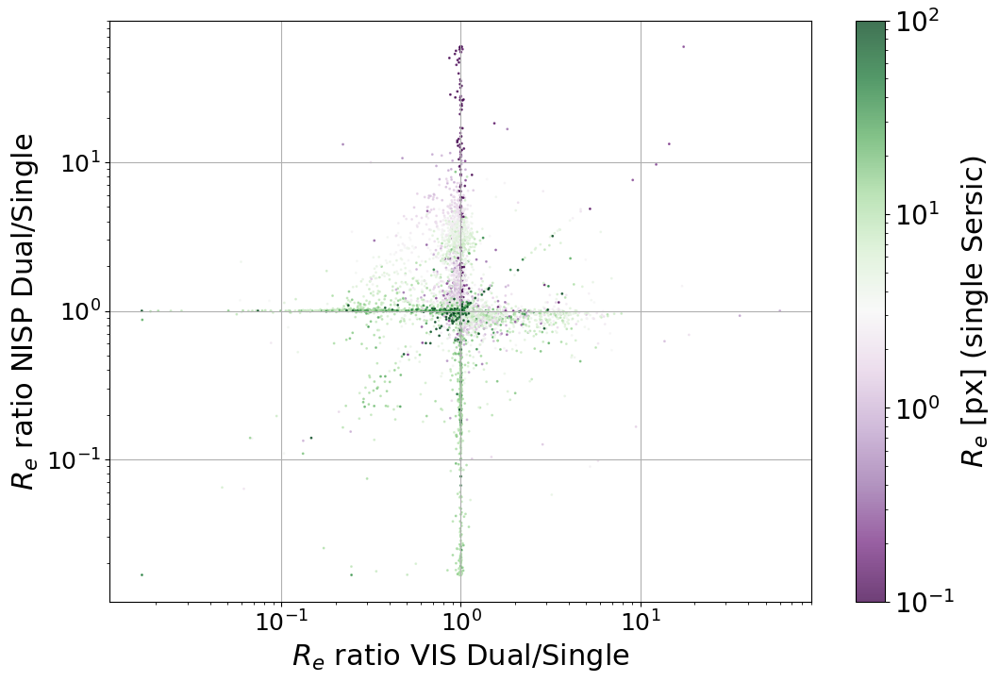

In [24]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1, projection='scatter_density')

x, y1, y2 = ds['sersic_radius'], dt['sersic_radius_vis'], dt['sersic_radius_nir']

z = ds['mag_VIS']
mag_lim = z < 25
x, y1, y2, z = x[mag_lim], y1[mag_lim], y2[mag_lim], z[mag_lim]

im = plt.scatter(y1/x, y2/x, s=1, c=x, cmap='PRGn', alpha=0.75, norm=mpl.colors.LogNorm(vmin=0.1, vmax=100))

cbar = plt.colorbar(im)
cbar.set_label(r'$R_e$ [px] (single Sersic)', fontsize = 22) 
cbar.ax.tick_params(labelsize = 20)   

plt.xlabel(r'$R_e$ ratio VIS Dual/Single')
plt.ylabel(r'$R_e$ ratio NISP Dual/Single')
plt.xscale('log')
plt.yscale('log')
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/Re_both_dual_over_single_cmap_Re.png', format='png')
plt.show()

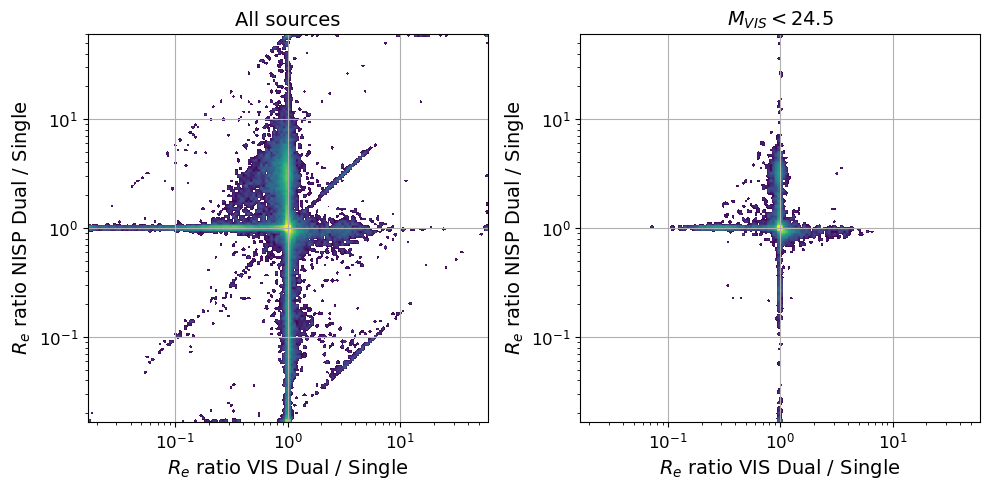

In [25]:
fig, axs = plt.subplots(1, 2, sharey=True, sharex=True, figsize=(10,5))

x, y1, y2 = ds['sersic_radius'], dt['sersic_radius_vis'], dt['sersic_radius_nir']
axs[0].remove()
ax1= fig.add_subplot(1, 2, 1, projection='scatter_density')
ax1.set_title('All sources', fontsize = 14)
density1 = ax1.scatter_density(y1/x, y2/x, norm=mpl.colors.LogNorm(vmin=1, vmax=1000), cmap=white_viridis, dpi = 40)

z = ds['mag_VIS']
mag_lim = z < 25
x, y1, y2, z = x[mag_lim], y1[mag_lim], y2[mag_lim], z[mag_lim]
axs[1].remove()
ax2= fig.add_subplot(1, 2, 2, projection='scatter_density')
ax2.set_title(r'$M_{VIS} < 24.5$', fontsize = 14)
density2 = ax2.scatter_density(y1/x, y2/x, norm=mpl.colors.LogNorm(vmin=1, vmax=1000), cmap=white_viridis, dpi = 40)

fig.colorbar(density, label='Number of points per pixel')  
for ax in [ax1, ax2]:
    ax.set_xlabel(r'$R_e$ ratio VIS Dual / Single', fontsize = 14)
    ax.set_ylabel(r'$R_e$ ratio NISP Dual / Single', fontsize = 14)
    ax.set(xscale='log')
    ax.set(yscale='log')
    ax.grid()
    ax.tick_params(labelsize = 12)
    
plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/Re_both_dual_over_single_density.png', format='png')
plt.show()

### Sersic index

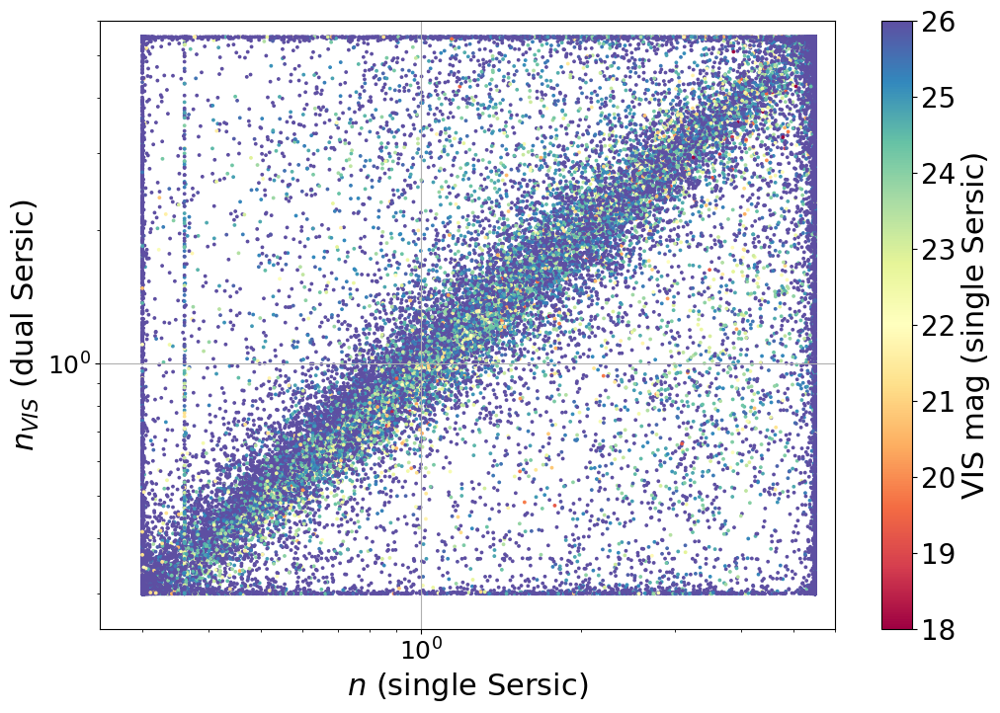

In [26]:
x, y = ds['sersic'], dt['sersic_vis']
z = ds['mag_VIS']

im = plt.scatter(x, y, c=z, cmap='Spectral', s=3, norm=mpl.colors.Normalize(vmin=18, vmax=26))

cbar = plt.colorbar(im)
cbar.set_label(r'VIS mag (single Sersic)', fontsize = 22) 
cbar.ax.tick_params(labelsize = 20)   

plt.xlabel(r'$n$ (single Sersic)')
plt.ylabel(r'$n_{VIS}$ (dual Sersic)')
plt.xticks([0.5,1,2,3,4,5])
plt.xscale('log')
plt.yscale('log')
plt.xlim(0.25, 6)
plt.ylim(0.25, 6)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/sersic_index_VIS_dual_vs_single_cmap_mag.png', format='png')
plt.show()

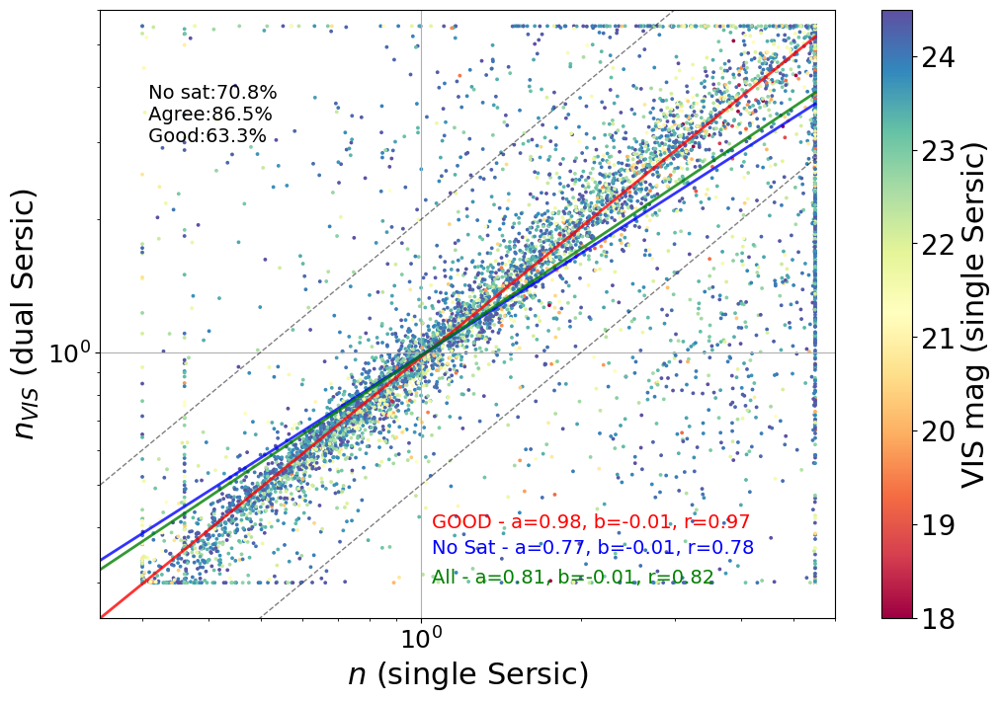

In [27]:
x, y = ds['sersic'], dt['sersic_vis']
z = ds['mag_VIS']

mag_lim = z<24.5
x, y, z = x[mag_lim], y[mag_lim], z[mag_lim]

nonsat = (x < 5.4) & (y < 5.4) & (x > 0.315) &(y > 0.315)
n_ok = np.sum(nonsat)
frac_ok = np.round(100*n_ok/len(x),1)
agree = (y/x > 1/2) & (y/x < 2)
n_agree = np.sum(agree)
frac_agree = np.round(100*n_agree/len(x),1)
good = nonsat & agree
n_good = np.sum(good)
frac_good = np.round(100*n_good/len(x),1)
plt.text(0.3, 3, ' No sat:'+str(frac_ok)+'% \n Agree:'+str(frac_agree)+'% \n Good:'+str(frac_good)+'%', fontsize = 14)

a = np.linspace(0.25,5.5,10)
#plt.plot(a, a, c='k', lw=1, alpha=0.5)
plt.plot(a, a/2, c='k', lw=1, alpha=0.5, ls='--')
plt.plot(a, a*2, c='k', lw=1, alpha=0.5, ls='--')

p = np.polyfit(np.log10(x[good]), np.log10(y[good]), 1)
P = np.poly1d(p)
plt.plot(a, np.power(10,P(np.log10(a))), c='r', lw=2, alpha=0.8)
r = pearsonr(np.log10(x[good]), np.log10(y[good]))

p2 = np.polyfit(np.log10(x[nonsat]), np.log10(y[nonsat]), 1)
P2 = np.poly1d(p2)
plt.plot(a, np.power(10,P2(np.log10(a))), c='b', lw=2, alpha=0.8)
r_bis = pearsonr(np.log10(x[nonsat]), np.log10(y[nonsat]))

p3 = np.polyfit(np.log10(x), np.log10(y), 1)
P3 = np.poly1d(p3)
plt.plot(a, np.power(10,P3(np.log10(a))), c='g', lw=2, alpha=0.8)
r_ter = pearsonr(np.log10(x), np.log10(y))


plt.text(1.05,0.4,'GOOD - a='+str(np.round(p[0],2))+', b='+str(np.round(p[1],2))+', r='+str(np.round(r[0],2)), c='r', fontsize=14)
plt.text(1.05,0.35,'No Sat - a='+str(np.round(p2[0],2))+', b='+str(np.round(p2[1],2))+', r='+str(np.round(r_bis[0],2)), c='b', fontsize=14)
plt.text(1.05,0.3,'All - a='+str(np.round(p3[0],2))+', b='+str(np.round(p3[1],2))+', r='+str(np.round(r_ter[0],2)), c='g', fontsize=14)

im = plt.scatter(x, y, c=z, cmap='Spectral', s=3, norm=mpl.colors.Normalize(vmin=18, vmax=24.5))

cbar = plt.colorbar(im)
cbar.set_label(r'VIS mag (single Sersic)', fontsize = 22) 
cbar.ax.tick_params(labelsize = 20)   

plt.xlabel(r'$n$ (single Sersic)')
plt.ylabel(r'$n_{VIS}$ (dual Sersic)')
plt.xticks([0.5,1,2,3,4,5])
plt.xscale('log')
plt.yscale('log')
plt.xlim(0.25, 6)
plt.ylim(0.25, 6)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/sersic_index_VIS_dual_vs_single_cmap_mag_lim.png', format='png')
plt.show()

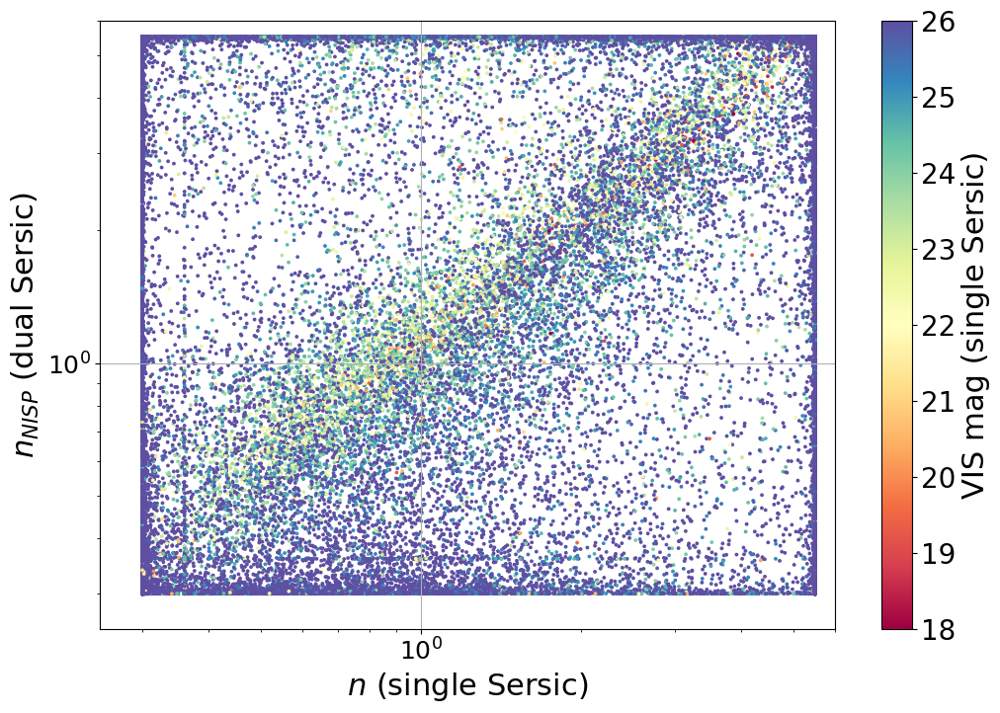

In [28]:
x, y = ds['sersic'], dt['sersic_nir']
z = ds['mag_VIS']

im = plt.scatter(x, y, c=z, cmap='Spectral', s=3, norm=mpl.colors.Normalize(vmin=18, vmax=26))

cbar = plt.colorbar(im)
cbar.set_label(r'VIS mag (single Sersic)', fontsize = 22) 
cbar.ax.tick_params(labelsize = 20)   

plt.xlabel(r'$n$ (single Sersic)')
plt.ylabel(r'$n_{NISP}$ (dual Sersic)')
plt.xticks([0.5,1,2,3,4,5])
plt.xscale('log')
plt.yscale('log')
plt.xlim(0.25, 6)
plt.ylim(0.25, 6)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/sersic_index_NISP_dual_vs_single_cmap_mag.png', format='png')
plt.show()

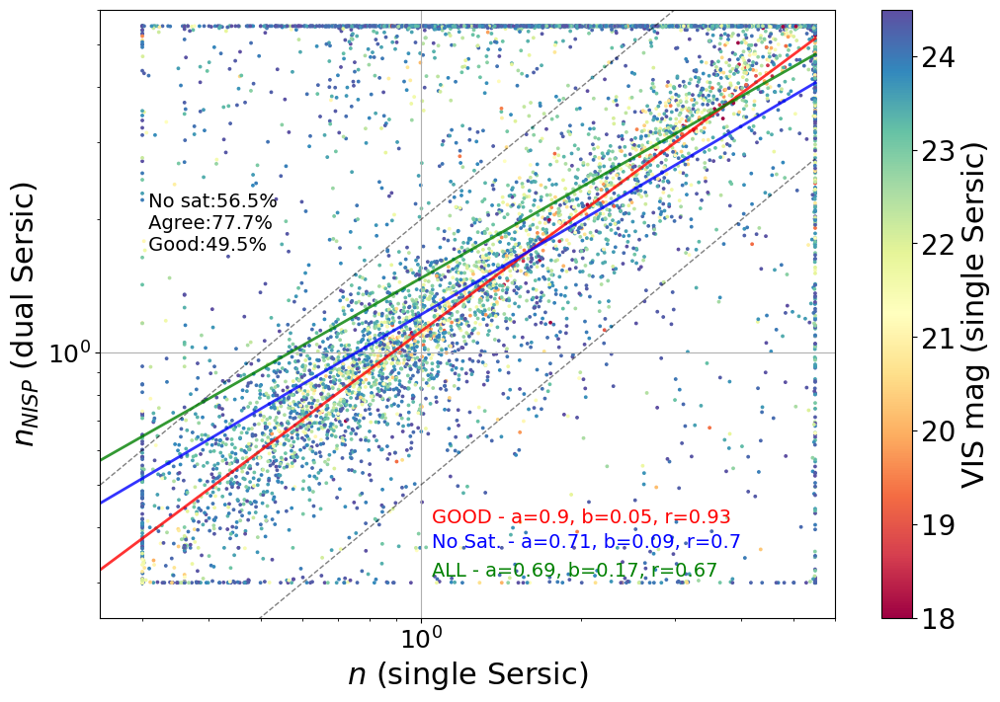

In [29]:
x, y = ds['sersic'], dt['sersic_nir']
z = ds['mag_VIS']

mag_lim = z<24.5
x, y, z = x[mag_lim], y[mag_lim], z[mag_lim]

nonsat = (x < 5.4) & (y < 5.4) & (x > 0.315) &(y > 0.315)
n_ok = np.sum(nonsat)
frac_ok = np.round(100*n_ok/len(x),1)
agree = (y/x > 1/2) & (y/x < 2)
n_agree = np.sum(agree)
frac_agree = np.round(100*n_agree/len(x),1)
good = nonsat & agree
n_good = np.sum(good)
frac_good = np.round(100*n_good/len(x),1)
plt.text(0.3, 1.7, ' No sat:'+str(frac_ok)+'% \n Agree:'+str(frac_agree)+'% \n Good:'+str(frac_good)+'%', fontsize = 14)

a = np.linspace(0.25,5.5,10)
#plt.plot(a, a, c='k', lw=1, alpha=0.5)
plt.plot(a, a/2, c='k', lw=1, alpha=0.5, ls='--')
plt.plot(a, a*2, c='k', lw=1, alpha=0.5, ls='--')

p = np.polyfit(np.log10(x[good]), np.log10(y[good]), 1)
P = np.poly1d(p)
plt.plot(a, np.power(10,P(np.log10(a))), c='r', lw=2, alpha=0.8)
r = pearsonr(np.log10(x[good]), np.log10(y[good]))

p2 = np.polyfit(np.log10(x[nonsat]), np.log10(y[nonsat]), 1)
P2 = np.poly1d(p2)
plt.plot(a, np.power(10,P2(np.log10(a))), c='b', lw=2, alpha=0.8)
r_bis = pearsonr(np.log10(x[nonsat]), np.log10(y[nonsat]))

p3 = np.polyfit(np.log10(x), np.log10(y), 1)
P3 = np.poly1d(p3)
plt.plot(a, np.power(10,P3(np.log10(a))), c='g', lw=2, alpha=0.8)
r_ter = pearsonr(np.log10(x), np.log10(y))


plt.text(1.05,0.41,'GOOD - a='+str(np.round(p[0],2))+', b='+str(np.round(p[1],2))+', r='+str(np.round(r[0],2)), c='r', fontsize=14)
plt.text(1.05,0.36,'No Sat. - a='+str(np.round(p2[0],2))+', b='+str(np.round(p2[1],2))+', r='+str(np.round(r_bis[0],2)), c='b', fontsize=14)
plt.text(1.05,0.31,'ALL - a='+str(np.round(p3[0],2))+', b='+str(np.round(p3[1],2))+', r='+str(np.round(r_ter[0],2)), c='g', fontsize=14)

im = plt.scatter(x, y, c=z, cmap='Spectral', s=3, norm=mpl.colors.Normalize(vmin=18, vmax=24.5))

cbar = plt.colorbar(im)
cbar.set_label(r'VIS mag (single Sersic)', fontsize = 22) 
cbar.ax.tick_params(labelsize = 20)   

plt.xlabel(r'$n$ (single Sersic)')
plt.ylabel(r'$n_{NISP}$ (dual Sersic)')
plt.xticks([0.5,1,2,3,4,5])
plt.xscale('log')
plt.yscale('log')
plt.xlim(0.25, 6)
plt.ylim(0.25, 6)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/sersic_index_NISP_dual_vs_single_cmap_mag_lim.png', format='png')
plt.show()

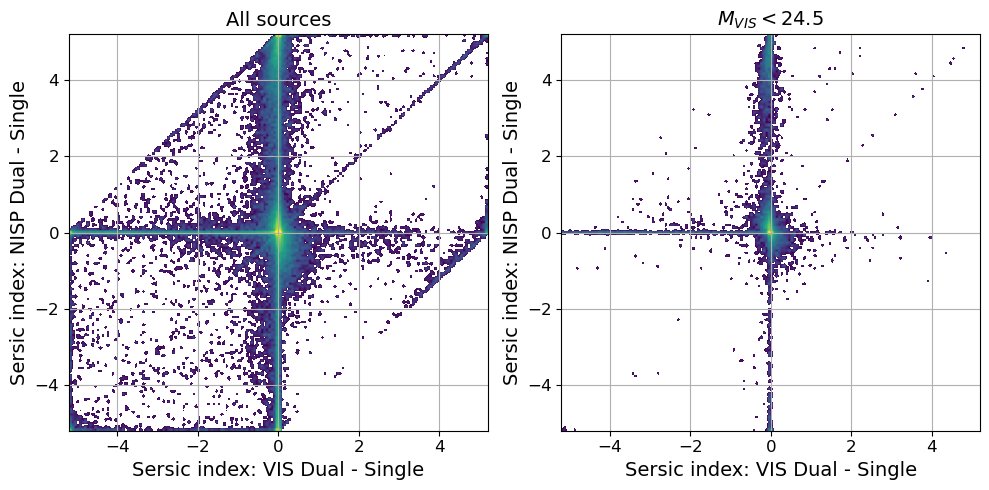

In [30]:
fig, axs = plt.subplots(1, 2, sharey=True, sharex=True, figsize=(10,5))

x, y1, y2 = ds['sersic'], dt['sersic_vis'], dt['sersic_nir']

axs[0].remove()
ax1= fig.add_subplot(1, 2, 1, projection='scatter_density')
ax1.set_title('All sources', fontsize = 14)
density1 = ax1.scatter_density(y1-x, y2-x, norm=mpl.colors.LogNorm(vmin=1, vmax=1000), cmap=white_viridis, dpi = 40)

z = ds['mag_VIS']
mag_lim = z < 25
x, y1, y2, z = x[mag_lim], y1[mag_lim], y2[mag_lim], z[mag_lim]
axs[1].remove()
ax2= fig.add_subplot(1, 2, 2, projection='scatter_density')
ax2.set_title(r'$M_{VIS} < 24.5$', fontsize = 14)
density2 = ax2.scatter_density(y1-x, y2-x, norm=mpl.colors.LogNorm(vmin=1, vmax=1000), cmap=white_viridis, dpi = 40)

fig.colorbar(density, label='Number of points per pixel')  
for ax in [ax1, ax2]:
    ax.set_xlabel('Sersic index: VIS Dual - Single', fontsize = 14)
    ax.set_ylabel('Sersic index: NISP Dual - Single', fontsize = 14)
    ax.grid()
    ax.tick_params(labelsize = 12)
    
plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/Sersic_index_both_dual_minus_single_density.png', format='png')
plt.show()

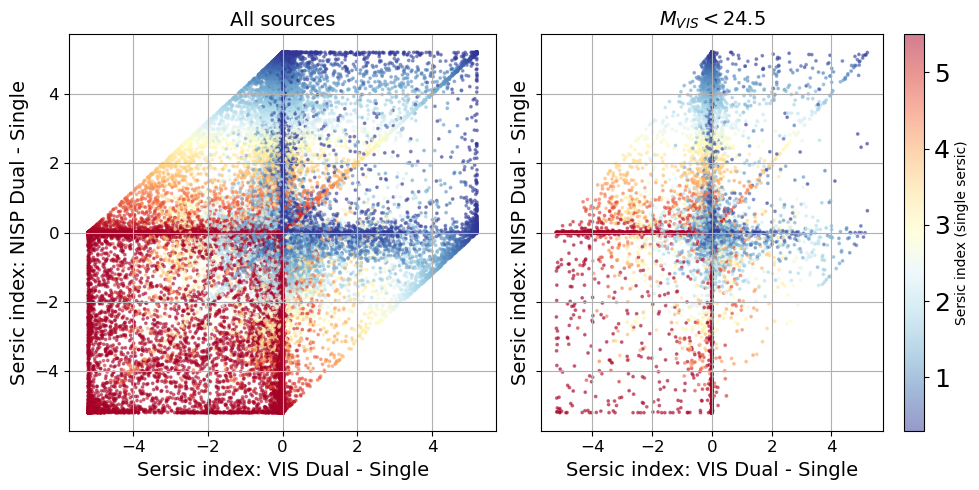

In [48]:
fig, axs = plt.subplots(1, 2, sharey=True, sharex=True, figsize=(10,5))

x, y1, y2 = ds['sersic'], dt['sersic_vis'], dt['sersic_nir']

axs[0].set_title('All sources', fontsize = 14)
im0 = axs[0].scatter(y1-x, y2-x, c=x, s=3, alpha=0.5, norm=mpl.colors.Normalize(vmin=0.3, vmax=5.5), cmap='RdYlBu_r')
#plt.colorbar(im0,ax=axs[0])

z = ds['mag_VIS']
mag_lim = z < 25
x, y1, y2, z = x[mag_lim], y1[mag_lim], y2[mag_lim], z[mag_lim]
axs[1].set_title(r'$M_{VIS} < 24.5$', fontsize = 14)
im1 = axs[1].scatter(y1-x, y2-x, c=x, s=3, alpha=0.5, norm=mpl.colors.Normalize(vmin=0.3, vmax=5.5), cmap='RdYlBu_r')
cbar = plt.colorbar(im1,ax=axs[1])
cbar.set_label('Sersic index (single sersic)', fontsize = 10)
  
for ax in axs.flat:
    ax.set_xlabel('Sersic index: VIS Dual - Single', fontsize = 14)
    ax.set_ylabel('Sersic index: NISP Dual - Single', fontsize = 14)
    ax.grid()
    ax.tick_params(labelsize = 12)
    
plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/Sersic_index_both_dual_minus_single_cmap_n_single.png', format='png')
plt.show()

## Variations VIS - NISP allowed by the dual sersic run

### Effective radius

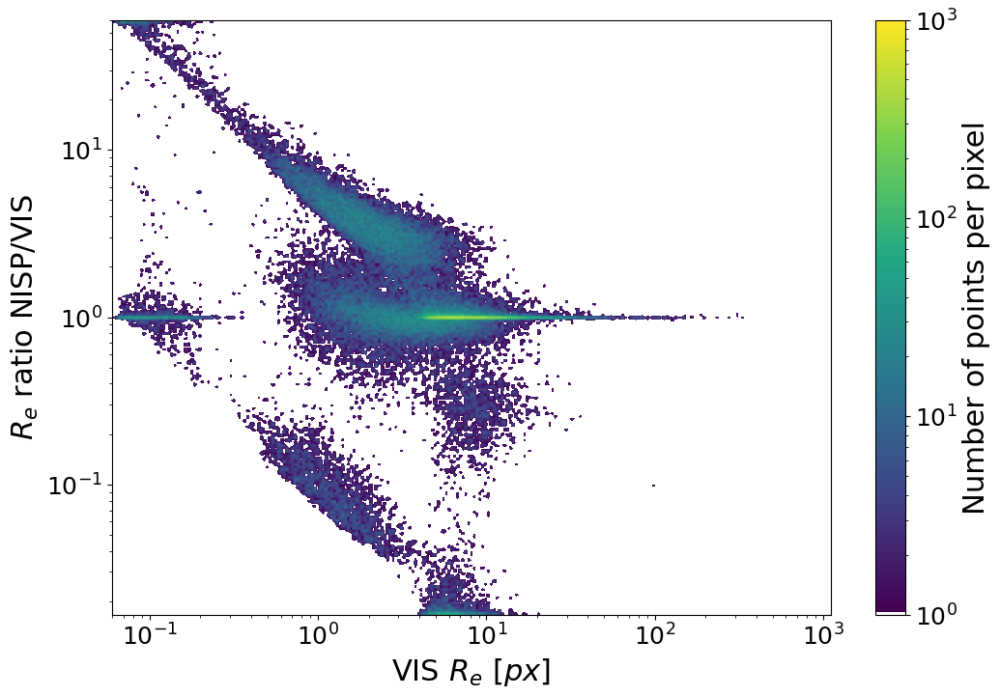

In [32]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1, projection='scatter_density')

x, y = dt['sersic_radius_vis'], dt['sersic_radius_nir']
density = ax.scatter_density(x, y/x, norm=mpl.colors.LogNorm(vmin=1, vmax=1000), cmap=white_viridis, dpi = 40)

fig.colorbar(density, label='Number of points per pixel')

plt.xlabel(r'VIS $R_e \ [px]$')
plt.ylabel(r'$R_e$ ratio NISP/VIS')
plt.xscale('log')
plt.yscale('log')
#plt.xlim(0.2, 50)
#plt.ylim(0.1, 20)
#plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/sersic_rad_ratio_compare_VIS_NISP_density.png', format='png')
plt.show()

In [33]:
print('All galaxies :', len(x))
for factor in [1.1, 1.25, 2, 5, 10]:
    print('Within '+str(int((factor-1)*100))+'%', np.sum((y/x > 1/factor) & (y/x < factor)))

All galaxies : 59545
Within 10% 20473
Within 25% 26317
Within 100% 33908
Within 400% 48148
Within 900% 53207


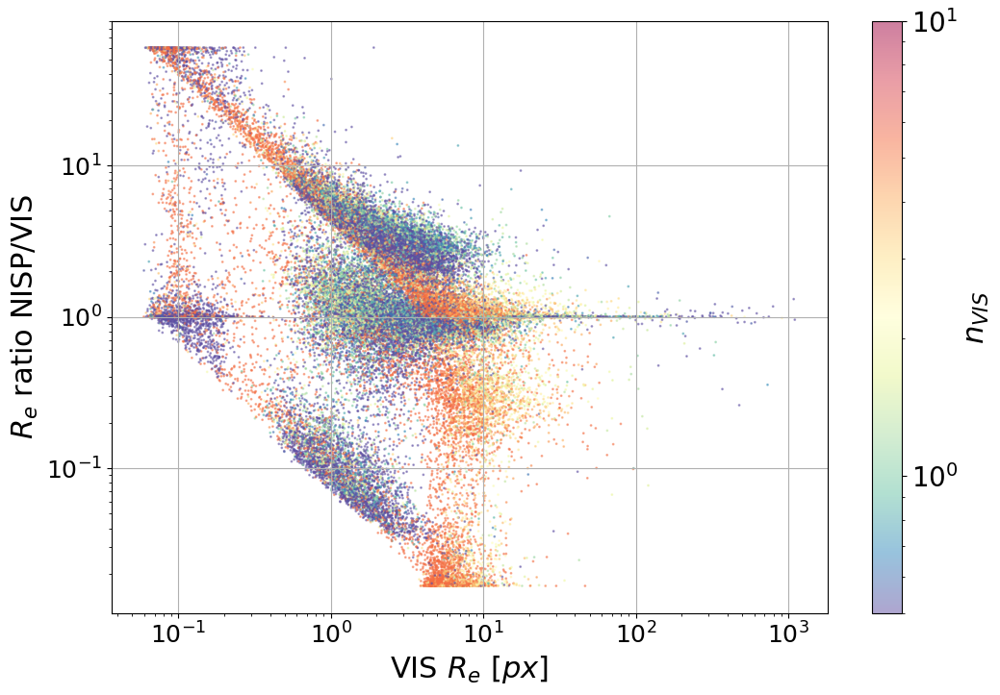

In [34]:
x, y = dt['sersic_radius_vis'], dt['sersic_radius_nir']
x_err, y_err = dt['sersic_radius_vis_err'], dt['sersic_radius_nir_err']
z = dt['sersic_vis']

im = plt.scatter(x, y/x, s=1, c=z, cmap='Spectral_r', alpha=0.5, norm=mpl.colors.LogNorm(vmin=0.5, vmax=10))
#mapper = mpl.cm.ScalarMappable(cmap = plt.cm.Spectral_r, norm=mpl.colors.LogNorm(vmin=0.5, vmax=10))
#e_color = np.array([(mapper.to_rgba(v)) for v in z])
#plt.errorbar(x, y, x_err, y_err, ls = '')

cbar = plt.colorbar(im)
cbar.set_label(r'$n_{VIS}$', fontsize = 22) 
cbar.ax.tick_params(labelsize = 20)   


plt.xlabel(r'VIS $R_e \ [px]$')
plt.ylabel(r'$R_e$ ratio NISP/VIS')
plt.xscale('log')
plt.yscale('log')
#plt.xlim(0.3, 20)
#plt.ylim(0.3, 5)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/sersic_rad_compare_VIS_NISP_cmap_nsersic.png', format='png')
plt.show()

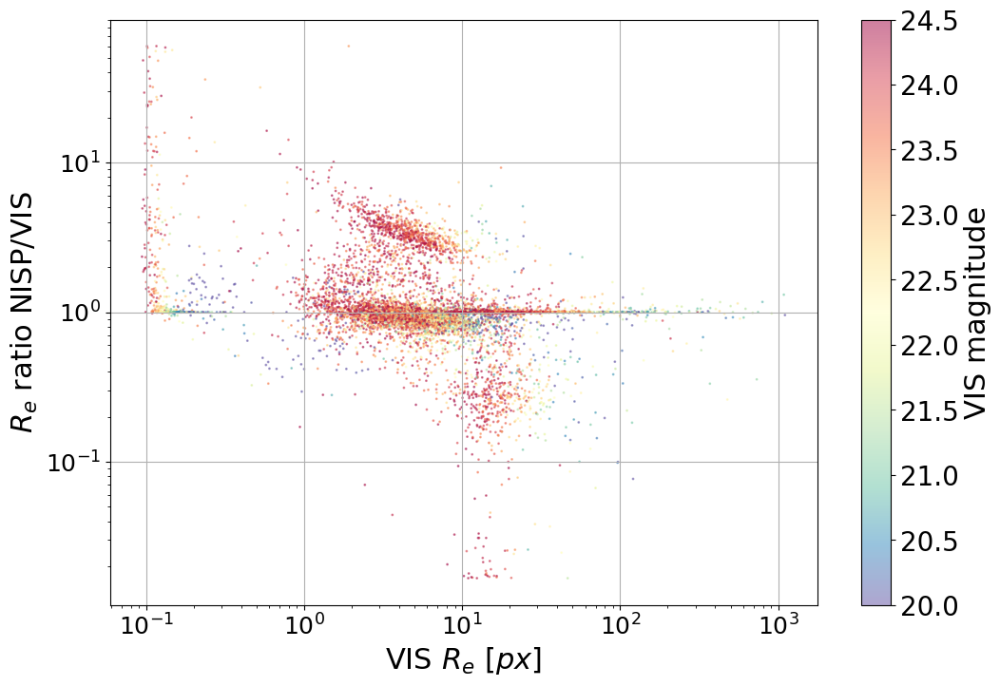

In [35]:
x, y = dt['sersic_radius_vis'], dt['sersic_radius_nir']
x_err, y_err = dt['sersic_radius_vis_err'], dt['sersic_radius_nir_err']
z = dt['mag_VIS']

mag_lim = z < 24.5
x, y, z = x[mag_lim], y[mag_lim], z[mag_lim]

im = plt.scatter(x, y/x, s=1, c=z, cmap='Spectral_r', alpha=0.5, norm=mpl.colors.Normalize(vmin=20, vmax=24.5))
#mapper = mpl.cm.ScalarMappable(cmap = plt.cm.Spectral_r, norm=mpl.colors.LogNorm(vmin=0.5, vmax=10))
#e_color = np.array([(mapper.to_rgba(v)) for v in z])
#plt.errorbar(x, y, x_err, y_err, ls = '')

cbar = plt.colorbar(im)
cbar.set_label(r'VIS magnitude', fontsize = 22) 
cbar.ax.tick_params(labelsize = 20)   


plt.xlabel(r'VIS $R_e \ [px]$')
plt.ylabel(r'$R_e$ ratio NISP/VIS')
plt.xscale('log')
plt.yscale('log')
#plt.xlim(0.3, 20)
#plt.ylim(0.3, 5)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/sersic_rad_compare_VIS_NISP_mag_lim_25_cmap_mag.png', format='png')
plt.show()

### Sersic index

59545 59545


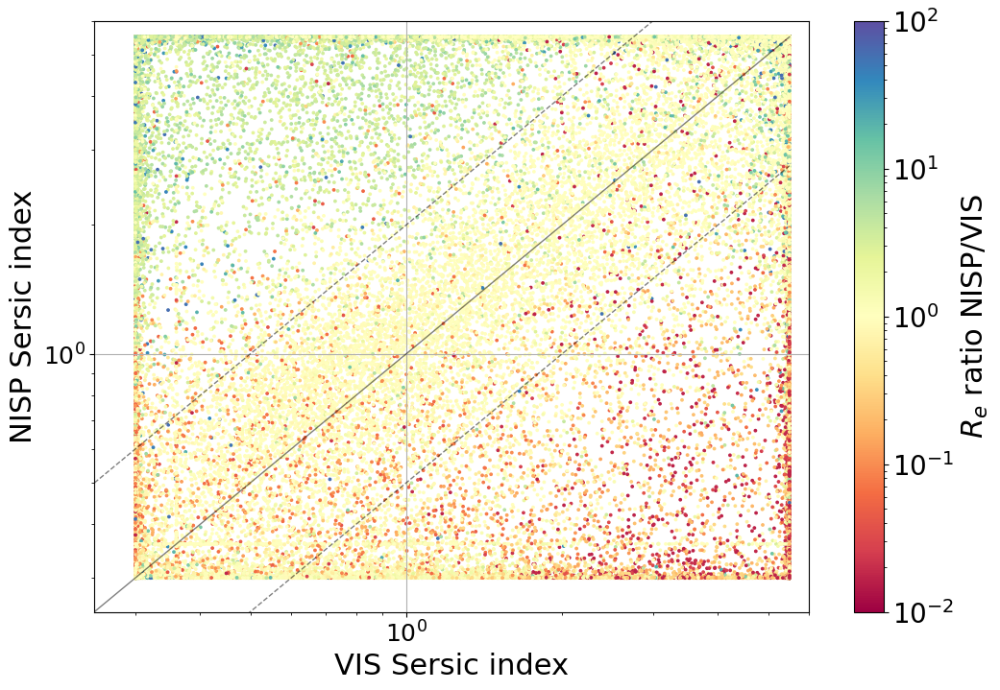

In [36]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1, projection='scatter_density')

print(len(dt), np.sum((dt['sersic_vis'] > 0.1) & (dt['sersic_nir'] > 0.1)))

x, y = dt['sersic_vis'], dt['sersic_nir']
x_err, y_err = dt['sersic_vis_err'], dt['sersic_nir_err']
z = dt['sersic_radius_nir']/dt['sersic_radius_vis']

im = plt.scatter(x, y, c=z, cmap='Spectral', s=3, norm=mpl.colors.LogNorm(vmin=0.01, vmax=100))

cbar = plt.colorbar(im)
cbar.set_label(r'$R_e$ ratio NISP/VIS', fontsize = 22) 
cbar.ax.tick_params(labelsize = 20)   

a = np.linspace(0.25,5.5)
plt.plot(a, a, c='k', lw=1, alpha=0.5)
plt.plot(a, a/2, c='k', lw=1, alpha=0.5, ls='--')
plt.plot(a, a*2, c='k', lw=1, alpha=0.5, ls='--')
#plt.axhline(0.315, c='k', lw=1, alpha=0.5, ls='--')
#plt.axhline(5.4, c='k', lw=1, alpha=0.5, ls='--')
#plt.axvline(5.4, c='k', lw=1, alpha=0.5, ls='--')
#plt.axvline(0.315, c='k', lw=1, alpha=0.5, ls='--')

plt.xlabel('VIS Sersic index')
plt.ylabel('NISP Sersic index')
plt.xticks([0.5,1,2,3,4,5])
plt.xscale('log')
plt.yscale('log')
plt.xlim(0.25, 6)
plt.ylim(0.25, 6)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/sersic_index_compare_VIS_NISP.png', format='png')
plt.show()

In [37]:
print(len(x))
print(np.sum(x > 5.4))
print(np.sum(y > 5.4))
print(np.sum(x < 0.315))
print(np.sum(y < 0.315))
print(np.sum((x > 5.4) | (y > 5.4) | (x < 0.315) |(y < 0.315) ))
print(np.sum((x > y/2) & (x < y*2)))
print(np.sum( (x > y/2) & (x < y*2) & (x < 5.4) & (y < 5.4) & (x > 0.315) & (y > 0.315) ))

59545
13296
22530
9975
6824
39936
30909
11669


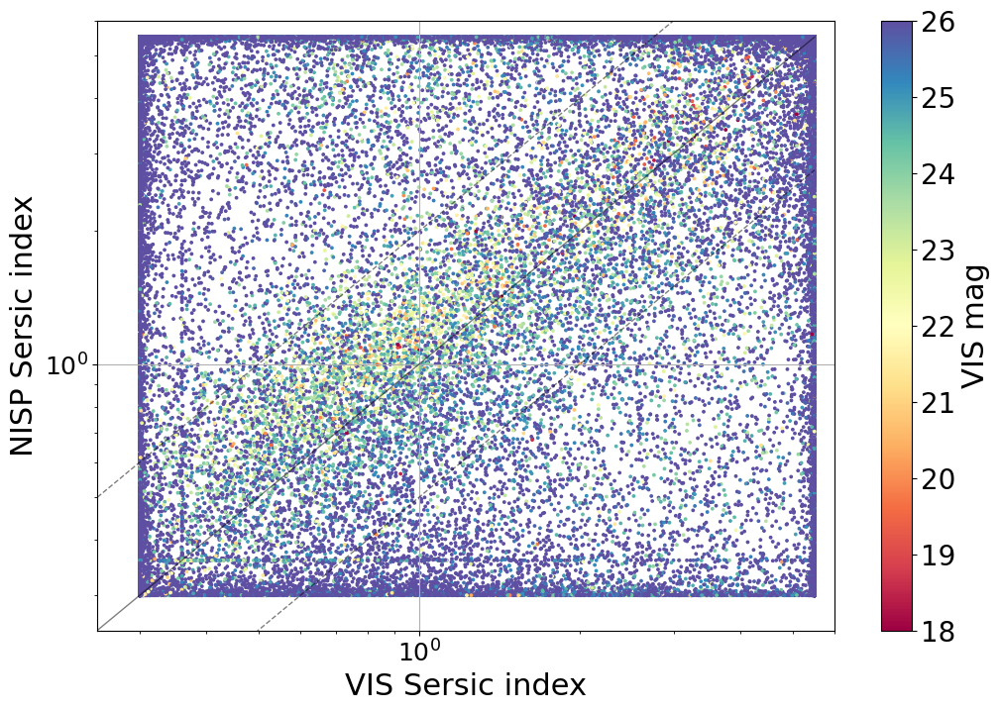

In [38]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1, projection='scatter_density')

x, y = dt['sersic_vis'], dt['sersic_nir']
z = dt['mag_VIS']

im = plt.scatter(x, y, c=z, cmap='Spectral', s=3, norm=mpl.colors.Normalize(vmin=18, vmax=26))

cbar = plt.colorbar(im)
cbar.set_label(r'VIS mag', fontsize = 22) 
cbar.ax.tick_params(labelsize = 20)   

a = np.linspace(0.25,5.5)
plt.plot(a, a, c='k', lw=1, alpha=0.5)
plt.plot(a, a/2, c='k', lw=1, alpha=0.5, ls='--')
plt.plot(a, a*2, c='k', lw=1, alpha=0.5, ls='--')
#plt.axhline(0.315, c='k', lw=1, alpha=0.5, ls='--')
#plt.axhline(5.4, c='k', lw=1, alpha=0.5, ls='--')
#plt.axvline(5.4, c='k', lw=1, alpha=0.5, ls='--')
#plt.axvline(0.315, c='k', lw=1, alpha=0.5, ls='--')

plt.xlabel('VIS Sersic index')
plt.ylabel('NISP Sersic index')
plt.xticks([0.5,1,2,3,4,5])
plt.xscale('log')
plt.yscale('log')
plt.xlim(0.25, 6)
plt.ylim(0.25, 6)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/sersic_index_compare_VIS_NISP_cmap_mag.png', format='png')
plt.show()

0.9162732053135819
0.5313542505837612
1.1865594292972785


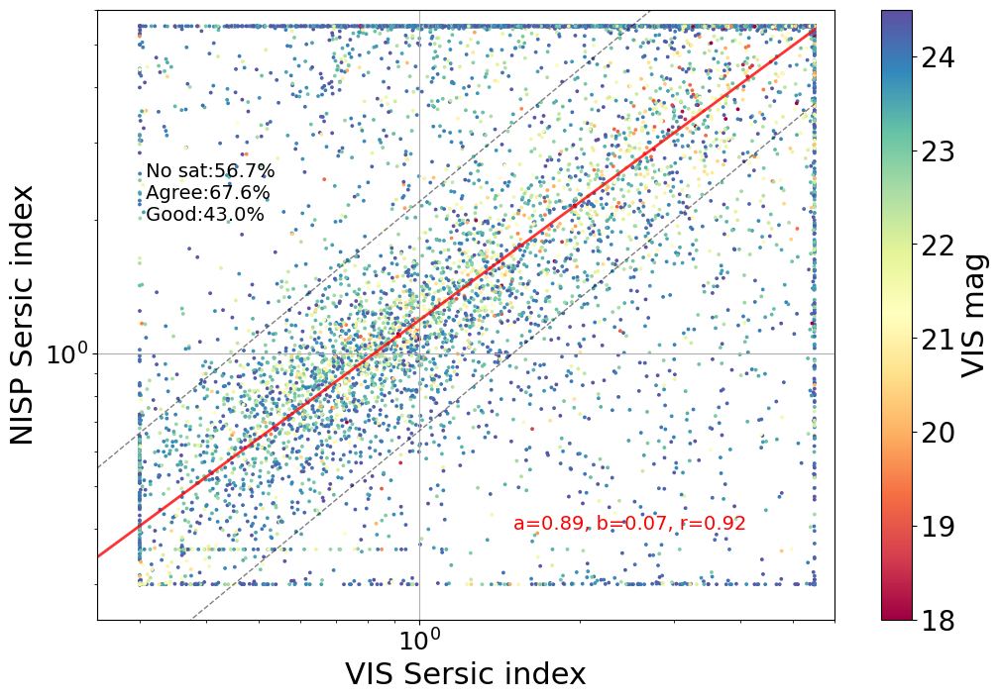

In [39]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1, projection='scatter_density')

x, y = dt['sersic_vis'], dt['sersic_nir']
z = dt['mag_VIS']

mag_lim = z<24.5
x, y, z = x[mag_lim], y[mag_lim], z[mag_lim]

nonsat = (x < 5.4) & (y < 5.4) & (x > 0.315) &(y > 0.315)
n_ok = np.sum(nonsat)
frac_ok = np.round(100*n_ok/len(x),1)
agree = (y/x > 1/1.5) & (y/x < 2.2)
n_agree = np.sum(agree)
frac_agree = np.round(100*n_agree/len(x),1)
good = nonsat & agree
n_good = np.sum(good)
frac_good = np.round(100*n_good/len(x),1)
plt.text(0.3, 2, ' No sat:'+str(frac_ok)+'% \n Agree:'+str(frac_agree)+'% \n Good:'+str(frac_good)+'%', fontsize = 14)

a = np.linspace(0.25,5.5,10)
#plt.plot(a, a, c='k', lw=1, alpha=0.5)
plt.plot(a, a/1.5, c='k', lw=1, alpha=0.5, ls='--')
plt.plot(a, a*2.2, c='k', lw=1, alpha=0.5, ls='--')

p = np.polyfit(np.log10(x[good]), np.log10(y[good]), 1)
P = np.poly1d(p)
plt.plot(a, np.power(10,P(np.log10(a))), c='r', lw=2, alpha=0.8)
r = pearsonr(np.log10(x[good]), np.log10(y[good]))
print(r[0])
r_bis = pearsonr(np.log10(x[nonsat]), np.log10(y[nonsat]))
print(r_bis[0])

print(pow(10,p[1]))

plt.text(1.5,0.4,'a='+str(np.round(p[0],2))+', b='+str(np.round(p[1],2))+', r='+str(np.round(r[0],2)), c='r', fontsize=14)

im = plt.scatter(x, y, c=z, cmap='Spectral', s=3, norm=mpl.colors.Normalize(vmin=18, vmax=24.5))

cbar = plt.colorbar(im)
cbar.set_label(r'VIS mag', fontsize = 22) 
cbar.ax.tick_params(labelsize = 20)

plt.xlabel('VIS Sersic index')
plt.ylabel('NISP Sersic index')
plt.xticks([0.5,1,2,3,4,5])
plt.xscale('log')
plt.yscale('log')
plt.xlim(0.25, 6)
plt.ylim(0.25, 6)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/sersic_index_compare_VIS_NISP_mag_lim_24.5.png', format='png')
plt.show()

59545 28952


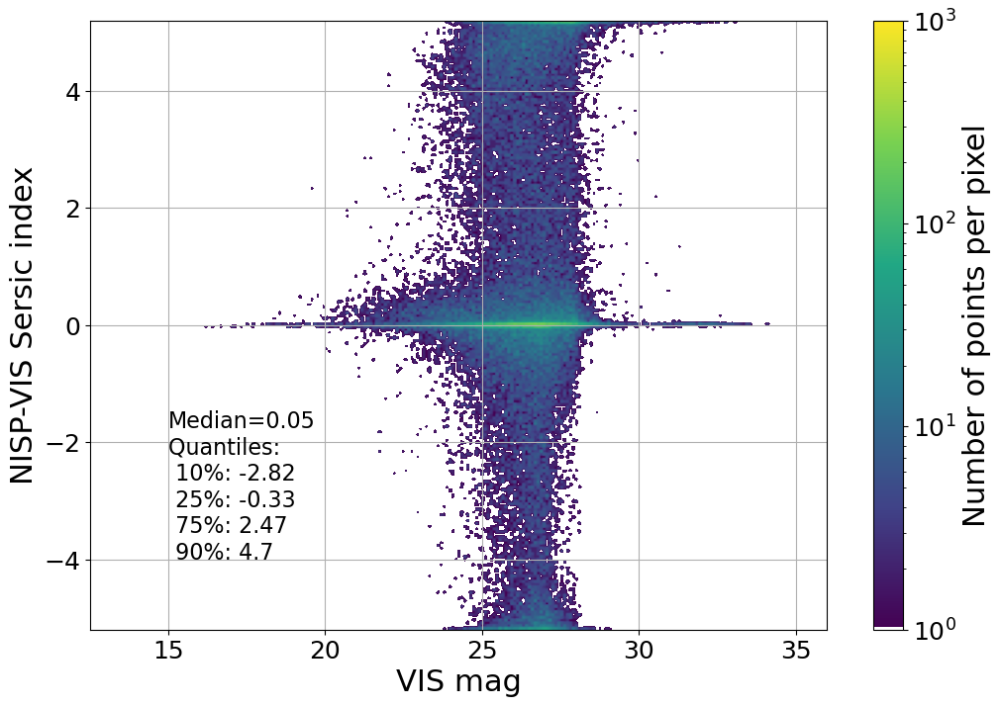

In [40]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1, projection='scatter_density')

x, y = dt['sersic_vis'], dt['sersic_nir']
z=dt['mag_VIS']

print(len(x), np.sum(np.abs(y-x) < 1))

density = ax.scatter_density(z, y-x, norm=mpl.colors.LogNorm(vmin=1, vmax=1000), cmap=white_viridis, dpi = 40)

fig.colorbar(density, label='Number of points per pixel')

med = np.round(np.median(y-x),2)
q10 = np.round(np.quantile(y-x,0.10),2)
q25 = np.round(np.quantile(y-x,0.25),2)
q75 = np.round(np.quantile(y-x,0.75),2)
q90 = np.round(np.quantile(y-x,0.90),2)
plt.text(15,-4,'Median='+str(med)+'\n'+'Quantiles: \n 10%: '+str(q10)+'\n 25%: '+str(q25)+'\n 75%: '+str(q75)+'\n 90%: '+str(q90), fontsize=16)

#plt.scatter(x,y, s=3)

plt.xlabel('VIS mag')
plt.ylabel('NISP-VIS Sersic index')
#plt.xscale('log')
#plt.yscale('log')
#plt.xlim(0.3, 20)
#plt.ylim(0.3, 5)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/sersic_index_diff_vs_mag_VIS.png', format='png')
plt.show()

7878 4894


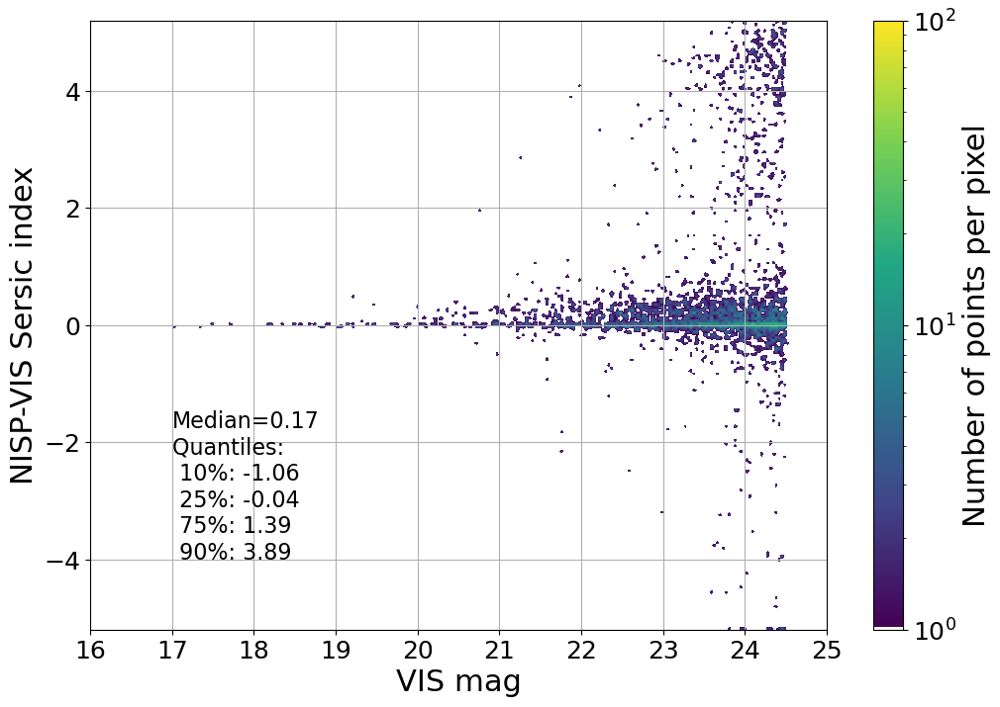

In [41]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1, projection='scatter_density')

x, y = dt['sersic_vis'], dt['sersic_nir']
z=dt['mag_VIS']

mag_lim = z<24.5
x, y, z = x[mag_lim], y[mag_lim], z[mag_lim]

print(len(x), np.sum(np.abs(y-x) < 1))

density = ax.scatter_density(z, y-x, norm=mpl.colors.LogNorm(vmin=1, vmax=100), cmap=white_viridis, dpi = 40)

fig.colorbar(density, label='Number of points per pixel')

med = np.round(np.median(y-x),2)
q10 = np.round(np.quantile(y-x,0.10),2)
q25 = np.round(np.quantile(y-x,0.25),2)
q75 = np.round(np.quantile(y-x,0.75),2)
q90 = np.round(np.quantile(y-x,0.90),2)
plt.text(17,-4,'Median='+str(med)+'\n'+'Quantiles: \n 10%: '+str(q10)+'\n 25%: '+str(q25)+'\n 75%: '+str(q75)+'\n 90%: '+str(q90), fontsize=16)

plt.xlabel('VIS mag')
plt.ylabel('NISP-VIS Sersic index')

plt.xlim(16, 25)
#plt.ylim(0.3, 5)
plt.grid()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/sersic_index_diff_vs_mag_VIS.png', format='png')
plt.show()

### Do params large variations in dual vs single match those in NISP vs VIS for the dual case ?

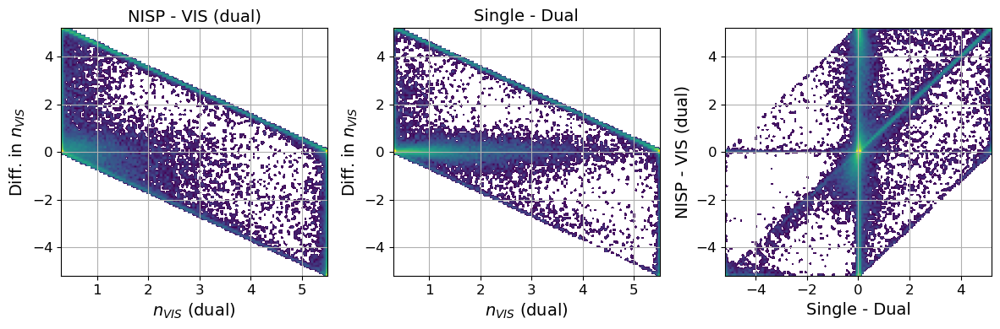

In [42]:
fig, axs = plt.subplots(1, 3, figsize=(12,4))

x, y, z = ds['sersic'], dt['sersic_vis'], dt['sersic_nir']

axs[0].remove()
ax1= fig.add_subplot(1, 3, 1, projection='scatter_density')
ax1.set_title('NISP - VIS (dual)', fontsize = 14)
density = ax1.scatter_density(y, z-y, norm=mpl.colors.LogNorm(vmin=1, vmax=3000), cmap=white_viridis, dpi = 40)

axs[1].remove()
ax2= fig.add_subplot(1, 3, 2, projection='scatter_density')
ax2.set_title('Single - Dual', fontsize = 14)
density = ax2.scatter_density(y, x-y, norm=mpl.colors.LogNorm(vmin=1, vmax=3000), cmap=white_viridis, dpi = 40)

axs[2].remove()
ax3= fig.add_subplot(1, 3, 3, projection='scatter_density')
ax3.set_xlabel('Single - Dual', fontsize = 14)
ax3.set_ylabel('NISP - VIS (dual)', fontsize = 14)
density = ax3.scatter_density(x-y, z-y, norm=mpl.colors.LogNorm(vmin=1, vmax=3000), cmap=white_viridis, dpi = 40)


for ax in [ax1, ax2]:
    ax.set_xlabel(r'$n_{VIS}$ (dual)', fontsize = 14)
    ax.set_ylabel(r'Diff. in $n_{VIS}$', fontsize = 14)
for ax in [ax1, ax2, ax3]:
    ax.grid()
    #ax.set(xlim = (14,35), ylim = (-8,7))
    ax.tick_params(labelsize = 12)
    

plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/sersic_index_offsets_bands_vs_methods.png', format='png')
plt.show()

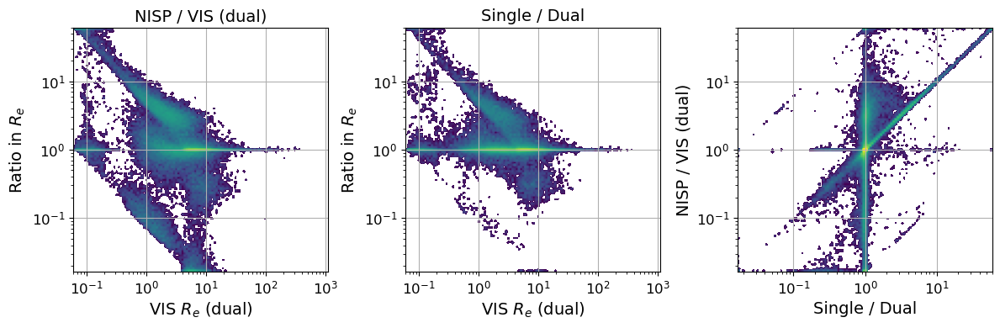

In [43]:
fig, axs = plt.subplots(1, 3, figsize=(12,4))

x, y, z = ds['sersic_radius'], dt['sersic_radius_vis'], dt['sersic_radius_nir']

axs[0].remove()
ax1= fig.add_subplot(1, 3, 1, projection='scatter_density')
ax1.set_title('NISP / VIS (dual)', fontsize = 14)
density = ax1.scatter_density(y, z/y, norm=mpl.colors.LogNorm(vmin=1, vmax=3000), cmap=white_viridis, dpi = 40)

axs[1].remove()
ax2= fig.add_subplot(1, 3, 2, projection='scatter_density')
ax2.set_title('Single / Dual', fontsize = 14)
density = ax2.scatter_density(y, x/y, norm=mpl.colors.LogNorm(vmin=1, vmax=3000), cmap=white_viridis, dpi = 40)

axs[2].remove()
ax3= fig.add_subplot(1, 3, 3, projection='scatter_density')
ax3.set_xlabel('Single / Dual', fontsize = 14)
ax3.set_ylabel('NISP / VIS (dual)', fontsize = 14)
density = ax3.scatter_density(x/y, z/y, norm=mpl.colors.LogNorm(vmin=1, vmax=3000), cmap=white_viridis, dpi = 40)


for ax in [ax1, ax2]:
    ax.set_xlabel(r'VIS $R_e$ (dual)', fontsize = 14)
    ax.set_ylabel(r'Ratio in $R_e$', fontsize = 14)
for ax in [ax1, ax2, ax3]:
    ax.set(xscale=('log'))
    ax.set(yscale=('log'))
    ax.grid()
    #ax.set(xlim = (14,35), ylim = (-8,7))
    ax.tick_params(labelsize = 12)
    

plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/effective_radius_offsets_bands_vs_methods.png', format='png')
plt.show()

### Until mag_lim = 24.5

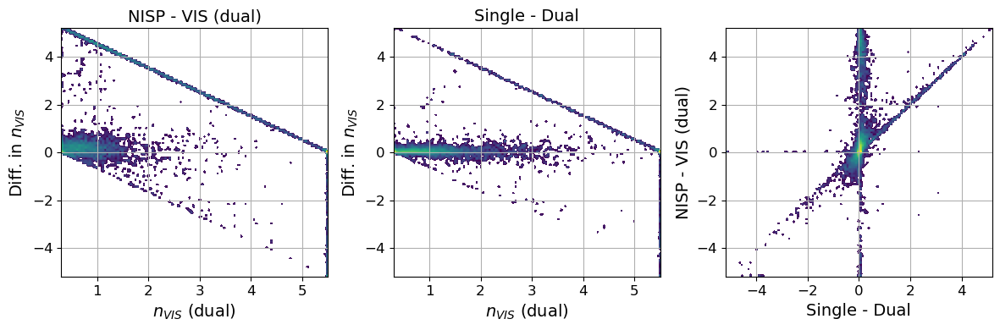

In [44]:
fig, axs = plt.subplots(1, 3, figsize=(12,4))

x, y, z = ds['sersic'], dt['sersic_vis'], dt['sersic_nir']
mag = dt['mag_VIS']
keep = mag < 24.5
x, y, z = x[keep], y[keep], z[keep]

axs[0].remove()
ax1= fig.add_subplot(1, 3, 1, projection='scatter_density')
ax1.set_title('NISP - VIS (dual)', fontsize = 14)
density = ax1.scatter_density(y, z-y, norm=mpl.colors.LogNorm(vmin=1, vmax=500), cmap=white_viridis, dpi = 40)

axs[1].remove()
ax2= fig.add_subplot(1, 3, 2, projection='scatter_density')
ax2.set_title('Single - Dual', fontsize = 14)
density = ax2.scatter_density(y, x-y, norm=mpl.colors.LogNorm(vmin=1, vmax=500), cmap=white_viridis, dpi = 40)

axs[2].remove()
ax3= fig.add_subplot(1, 3, 3, projection='scatter_density')
ax3.set_xlabel('Single - Dual', fontsize = 14)
ax3.set_ylabel('NISP - VIS (dual)', fontsize = 14)
density = ax3.scatter_density(x-y, z-y, norm=mpl.colors.LogNorm(vmin=1, vmax=500), cmap=white_viridis, dpi = 40)


for ax in [ax1, ax2]:
    ax.set_xlabel(r'$n_{VIS}$ (dual)', fontsize = 14)
    ax.set_ylabel(r'Diff. in $n_{VIS}$', fontsize = 14)
for ax in [ax1, ax2, ax3]:
    ax.grid()
    #ax.set(xlim = (14,35), ylim = (-8,7))
    ax.tick_params(labelsize = 12)
    

plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/sersic_index_offsets_bands_vs_methods_mag_lim.png', format='png')
plt.show()

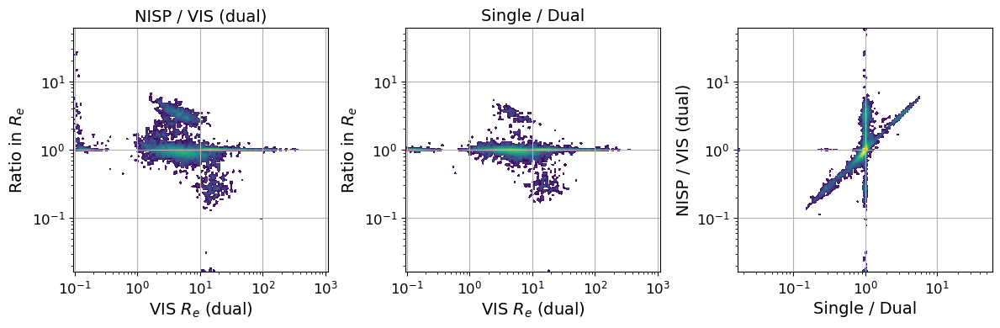

In [45]:
fig, axs = plt.subplots(1, 3, figsize=(12,4))

x, y, z = ds['sersic_radius'], dt['sersic_radius_vis'], dt['sersic_radius_nir']
mag = dt['mag_VIS']
keep = mag < 24.5
x, y, z = x[keep], y[keep], z[keep]

axs[0].remove()
ax1= fig.add_subplot(1, 3, 1, projection='scatter_density')
ax1.set_title('NISP / VIS (dual)', fontsize = 14)
density = ax1.scatter_density(y, z/y, norm=mpl.colors.LogNorm(vmin=1, vmax=500), cmap=white_viridis, dpi = 40)

axs[1].remove()
ax2= fig.add_subplot(1, 3, 2, projection='scatter_density')
ax2.set_title('Single / Dual', fontsize = 14)
density = ax2.scatter_density(y, x/y, norm=mpl.colors.LogNorm(vmin=1, vmax=500), cmap=white_viridis, dpi = 40)

axs[2].remove()
ax3= fig.add_subplot(1, 3, 3, projection='scatter_density')
ax3.set_xlabel('Single / Dual', fontsize = 14)
ax3.set_ylabel('NISP / VIS (dual)', fontsize = 14)
density = ax3.scatter_density(x/y, z/y, norm=mpl.colors.LogNorm(vmin=1, vmax=500), cmap=white_viridis, dpi = 40)


for ax in [ax1, ax2]:
    ax.set_xlabel(r'VIS $R_e$ (dual)', fontsize = 14)
    ax.set_ylabel(r'Ratio in $R_e$', fontsize = 14)
for ax in [ax1, ax2, ax3]:
    ax.set(xscale=('log'))
    ax.set(yscale=('log'))
    ax.grid()
    #ax.set(xlim = (14,35), ylim = (-8,7))
    ax.tick_params(labelsize = 12)
    

plt.tight_layout()
plt.savefig('../Pictures/validation_fits_Cosmos_Euclid/effective_radius_offsets_bands_vs_methods_mag_lim.png', format='png')
plt.show()